<a href="https://colab.research.google.com/github/olaf-ys/BA865_GS_Stock_Analysis/blob/main/Goldman_Sachs_Yuanshan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install yfinance
!pip install ta

  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29411 sha256=f450d88be5be97894f70ee9df8fa6beb9e1d572d0e5e23e41e47f52f5072a529
  Stored in directory: /root/.cache/pip/wheels/5f/67/4f/8a9f252836e053e532c6587a3230bc72a4deb16b03a829610b
Successfully built ta


# Load Data

In [ ]:
import yfinance as yf
import datetime

# Define the stock ticker symbol and the time period
## DO NOT CHANE THESE VALUES!
stock_symbol = 'GS'
start_date = '1999-05-04'
end_date = '2024-04-8'

# Fetch the historical stock price data
stock_data = yf.download(stock_symbol, start=start_date, end=end_date)

import plotly
import plotly.graph_objs as go

# Create a line plot of the stock's closing price
fig = go.Figure(data=[go.Scatter(x=stock_data.index, y=stock_data['Close'], mode='lines', name='Close Price')])

# Set the layout for the plot
fig.update_layout(title=f'Stock Price of {stock_symbol}', xaxis_title='Date', yaxis_title='Price (USD)', template='plotly_dark')

# Display the plot
fig.show()

[*********************100%%**********************]  1 of 1 completed


# Technical Index

In [ ]:
import ta

# RSI
stock_data['RSI'] = ta.momentum.rsi(stock_data['Close'], window=14, fillna=True)

# SMA
stock_data['SMA'] = ta.trend.sma_indicator(stock_data['Close'], window=12, fillna=True)

# OBV
stock_data['OBV'] = ta.volume.on_balance_volume(stock_data['Close'], stock_data['Volume'], fillna=True)

# MACD related
# create an macd object
macd = ta.trend.MACD(stock_data['Close'], window_slow=26, window_fast=12, window_sign=9, fillna=True)

# MACD line
stock_data['MACD'] = macd.macd()

# MACD signal line
stock_data['MACD_signal'] = macd.macd_signal()

# MACD histogram/diff
stock_data['MACD_diff'] = macd.macd_diff()

stock_data.head()

,Open,High,Low,Close,Adj Close,Volume,RSI,SMA,OBV,MACD,MACD_signal,MACD_diff
Date,,,,,,,,,,,,
1999-05-04,76.0000,77.250,70.0000,70.3750,50.535969,22320900,100.000000,70.375000,22320900,0.000000,0.000000,0.000000
1999-05-05,69.8750,69.875,66.2500,69.1250,49.638348,7565700,0.000000,69.750000,14755200,-0.099715,-0.019943,-0.079772
1999-05-06,68.0000,69.375,67.0625,67.9375,48.785599,2905700,0.000000,69.145833,11849500,-0.271432,-0.070241,-0.201192
1999-05-07,67.9375,74.875,66.7500,74.1250,53.228813,4862300,73.942535,70.390625,16711800,0.090714,-0.038050,0.128764
1999-05-10,73.3750,73.500,70.2500,70.6875,50.760353,2589400,51.263855,70.450000,14122400,0.099197,-0.010601,0.109797


In [ ]:
stock_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6272 entries, 1999-05-04 to 2024-04-05
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Open         6272 non-null   float64
 1   High         6272 non-null   float64
 2   Low          6272 non-null   float64
 3   Close        6272 non-null   float64
 4   Adj Close    6272 non-null   float64
 5   Volume       6272 non-null   int64  
 6   RSI          6272 non-null   float64
 7   SMA          6272 non-null   float64
 8   OBV          6272 non-null   int64  
 9   MACD         6272 non-null   float64
 10  MACD_signal  6272 non-null   float64
 11  MACD_diff    6272 non-null   float64
dtypes: float64(10), int64(2)
memory usage: 637.0 KB


6272 samples; 12 columns; no missing values

# Train Test Split

In [ ]:
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(stock_data, test_size=0.5, shuffle=False)

df_test.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3136 entries, 2011-10-18 to 2024-04-05
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Open         3136 non-null   float64
 1   High         3136 non-null   float64
 2   Low          3136 non-null   float64
 3   Close        3136 non-null   float64
 4   Adj Close    3136 non-null   float64
 5   Volume       3136 non-null   int64  
 6   RSI          3136 non-null   float64
 7   SMA          3136 non-null   float64
 8   OBV          3136 non-null   int64  
 9   MACD         3136 non-null   float64
 10  MACD_signal  3136 non-null   float64
 11  MACD_diff    3136 non-null   float64
dtypes: float64(10), int64(2)
memory usage: 318.5 KB


The train data is from '1999-05-04' to '2019-04-10', and the test data is from '2019-04-11' to '2024-04-05'

Since we are going to use 1 year as the maximum episodes, the length of the sliding window should equal number of samples from '1999-05-04' to '2018-04-10'

In [ ]:
sequence_length = df_train['1999-05-04':'2018-04-11'].shape[0]
sequence_length

3136

In [ ]:
df_train.to_csv('GS_stock.csv', index=False)

# EDA

In [ ]:
df_train.describe()

,Open,High,Low,Close,Adj Close,Volume,RSI,SMA,OBV,MACD,MACD_signal,MACD_diff
count,3136.000000,3136.000000,3136.000000,3136.000000,3136.000000,3.136000e+03,3136.000000,3136.000000,3.136000e+03,3136.000000,3136.000000,3136.000000
mean,123.059774,124.868257,121.222610,123.074185,93.412905,6.776655e+06,51.348157,123.028361,-1.264630e+07,0.069620,0.074159,-0.004539
std,44.669994,45.079360,44.210942,44.634045,35.669626,7.753915e+06,11.763965,44.490272,1.781023e+08,3.247942,3.087832,0.893348
min,54.000000,54.540001,47.410000,52.000000,40.078686,1.076000e+05,0.000000,60.218750,-5.165184e+08,-15.001013,-13.727321,-5.179980
25%,87.000000,88.247499,85.717501,86.980003,63.915831,2.838575e+06,42.709102,87.067865,-4.887798e+07,-1.621404,-1.513900,-0.453410
50%,107.949997,109.455002,106.445000,108.029999,81.101612,4.302750e+06,51.040757,108.377083,1.461645e+07,0.334858,0.303567,-0.015844
75%,158.705002,160.502499,157.000000,158.770000,123.536421,7.746225e+06,59.635471,159.427291,1.088738e+08,1.893099,1.800327,0.460651
max,243.550003,250.699997,240.000000,247.919998,190.180954,1.145907e+08,100.000000,231.754167,2.836555e+08,12.060865,10.735164,3.868444


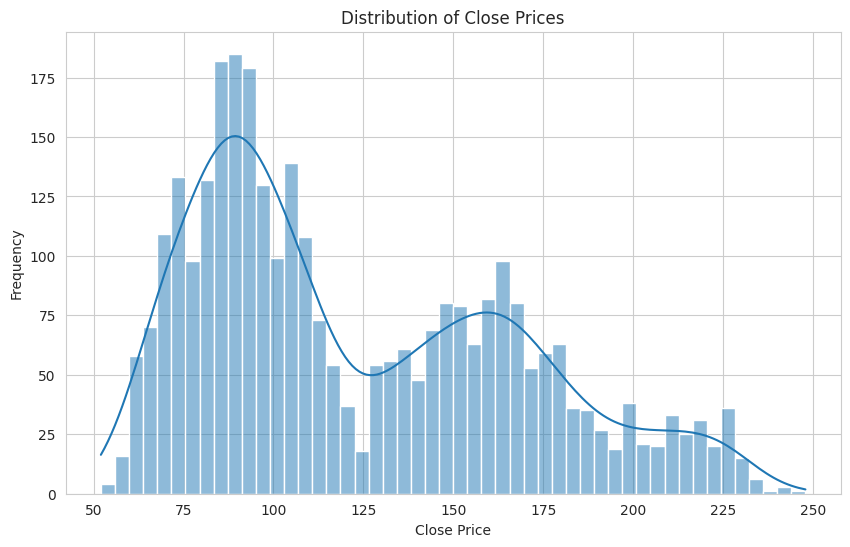

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style of seaborn
sns.set_style('whitegrid')

# Plot the distribution of 'Close' prices
plt.figure(figsize=(10, 6))
sns.histplot(df_train['Close'], bins=50, kde=True)
plt.title('Distribution of Close Prices')
plt.xlabel('Close Price')
plt.ylabel('Frequency')

# Show the plot
plt.show()

The price distribution is positively skewed

In [ ]:
# Calculate the median and variance of 'Close' prices
close_std = df_train['Close'].std()
close_std

44.634045179985456

## Correlation Analysis

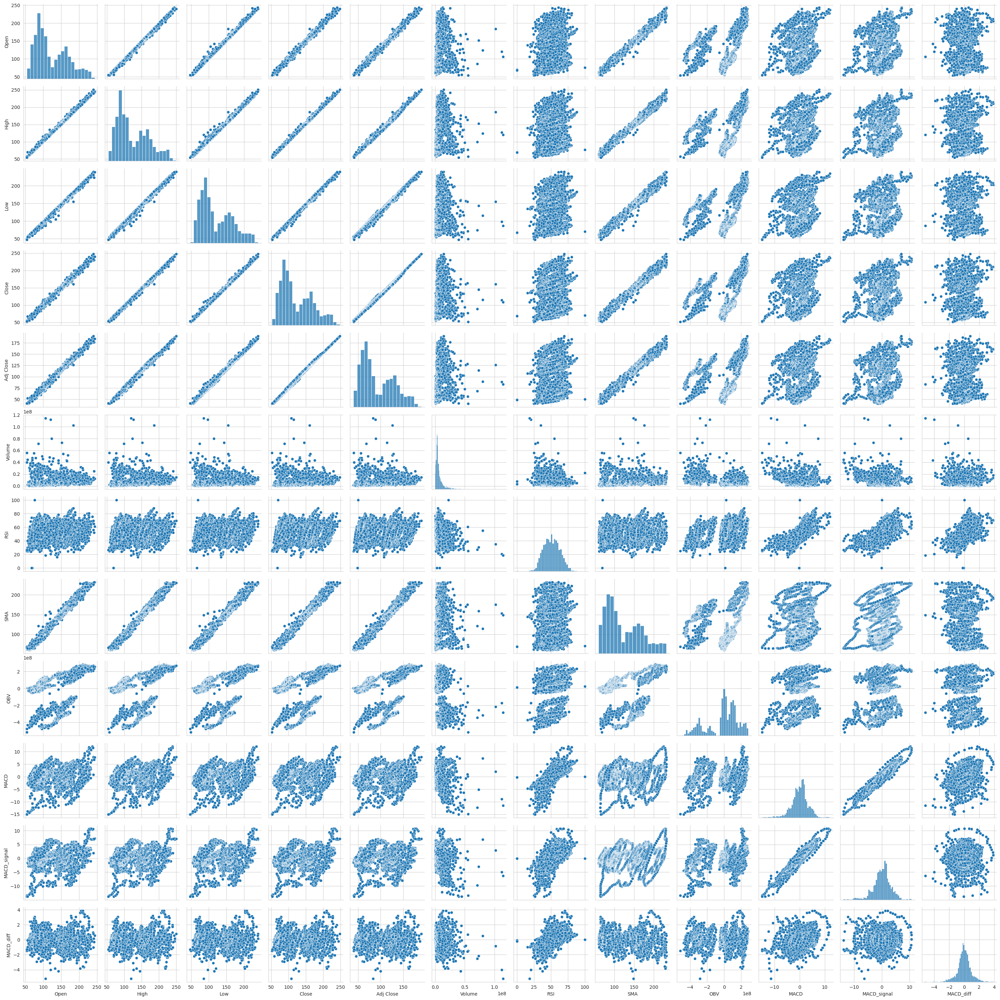

In [ ]:
import seaborn as sns

# Pairplot
sns.pairplot(df_train)
plt.show()

Original features are positively skewed

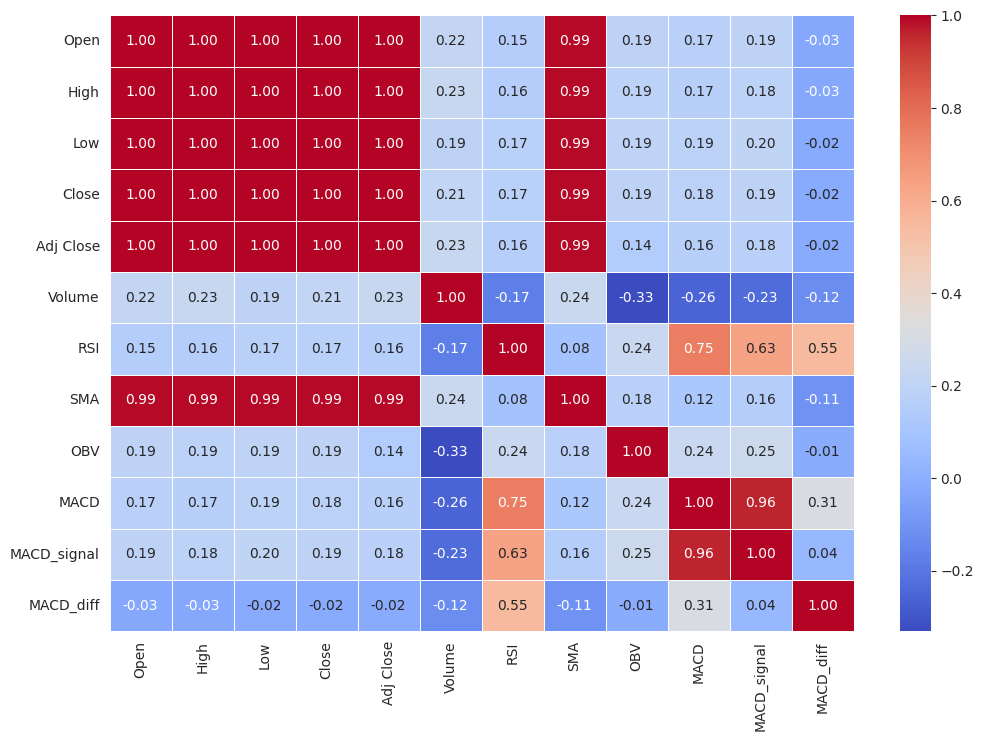

In [ ]:
# Compute the correlation matrix
correlation_matrix = df_train.corr()

# Plot correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.show()

# Traditional model

## XGBoost

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error,r2_score
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
import pandas as pd
from sklearn.metrics import mean_absolute_error

In [ ]:
stock_data_tradition=stock_data
stock_data_tradition['price_tomorrow'] = stock_data_tradition['Close'].shift(-1)

In [ ]:
stock_data_tradition

,Open,High,Low,Close,Adj Close,Volume,RSI,SMA,OBV,MACD,MACD_signal,MACD_diff,price_tomorrow
Date,,,,,,,,,,,,,
1999-05-04,76.000000,77.250000,70.000000,70.375000,50.535969,22320900,100.000000,70.375000,22320900,0.000000,0.000000,0.000000,69.125000
1999-05-05,69.875000,69.875000,66.250000,69.125000,49.638348,7565700,0.000000,69.750000,14755200,-0.099715,-0.019943,-0.079772,67.937500
1999-05-06,68.000000,69.375000,67.062500,67.937500,48.785599,2905700,0.000000,69.145833,11849500,-0.271432,-0.070241,-0.201192,74.125000
1999-05-07,67.937500,74.875000,66.750000,74.125000,53.228813,4862300,73.942535,70.390625,16711800,0.090714,-0.038050,0.128764,70.687500
1999-05-10,73.375000,73.500000,70.250000,70.687500,50.760353,2589400,51.263855,70.450000,14122400,0.099197,-0.010601,0.109797,70.625000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-01,416.679993,417.950012,412.000000,413.510010,413.510010,1863900,65.018506,401.951665,-231413100,7.153245,4.895010,2.258235,410.149994
2024-04-02,410.739990,413.170013,407.619995,410.149994,410.149994,1976000,61.174514,403.746666,-233389100,7.036993,5.323407,1.713586,414.000000
2024-04-03,411.000000,416.630005,411.000000,414.000000,414.000000,1549200,63.814405,405.979167,-231839900,7.172842,5.693294,1.479548,406.250000


In [ ]:
stock_data_tradition=stock_data_tradition.dropna()

In [ ]:
#Select features based on correlation matrix and train test split
X = stock_data_tradition[['SMA','Volume','RSI','OBV','MACD','MACD_diff']]
y = stock_data_tradition['price_tomorrow']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,shuffle=False)

In [ ]:
#Normalize the data
ss=StandardScaler()
X_train_scaled=ss.fit_transform(X_train)
X_test_scaled=ss.transform(X_test)

In [ ]:
#build the model
xgbmodel = xgb.XGBRegressor(objective ='reg:squarederror')
model=xgbmodel.fit(X_train_scaled, y_train)

In [ ]:
#Cross validation score
from sklearn.model_selection import cross_validate

scoring = ['r2', 'neg_mean_squared_error']
cross_val_results = cross_validate(model, X_train_scaled, y_train, cv=5, scoring=scoring)

cross_val_r2_scores = cross_val_results['test_r2']
cross_val_mse_scores = cross_val_results['test_neg_mean_squared_error']

In [ ]:
print(f'r2: {cross_val_r2_scores.mean():.6f}, mse: {-cross_val_mse_scores.mean():.36f}')

r2: 0.942969, mse: 33.846813598020176527825242374092340469


In [ ]:
# Train and test scores
y_pred_train = xgbmodel.predict(X_train_scaled)
y_pred_test = xgbmodel.predict(X_test_scaled)

train_mse = mean_squared_error(y_train, y_pred_train)
test_mse = mean_squared_error(y_test, y_pred_test)

train_mae = mean_absolute_error(y_train, y_pred_train)
test_mae = mean_absolute_error(y_test, y_pred_test)

train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)

train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)

print('Train Root Mean Squared Error:', train_rmse)
print('Test Rooot Mean Squared Error:', test_rmse)
print('Train Mean Absolute Error:', train_mae)
print('Test Mean Absolute Error:', test_mae)
print('Train R-squared:', train_r2)
print('Test R-squared:', test_r2)

Train Root Mean Squared Error: 1.1430148398430193
Test Rooot Mean Squared Error: 87.6052398853779
Train Mean Absolute Error: 0.8582427267551314
Test Mean Absolute Error: 61.50687538982071
Train R-squared: 0.9993211688621402
Test R-squared: -0.5403133033911154


In [ ]:
#Use random search
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint
from sklearn.model_selection import cross_val_score

param_dist = {
    'learning_rate': [0.001, 0.01, 0.1, 1],
    'max_depth': randint(3, 10),
    'reg_alpha': uniform(0, 1),
    'reg_lambda': uniform(0, 1),
}


xgb_reg = xgb.XGBRegressor(objective ='reg:squarederror')

random_search = RandomizedSearchCV(estimator=xgb_reg, param_distributions=param_dist,
                                   n_iter=100, scoring='neg_mean_squared_error',
                                   cv=5, verbose=1, random_state=42, n_jobs=-1)

random_search.fit(X_train_scaled, y_train)
print("Best Parameters:", random_search.best_params_)




best_model = random_search.best_estimator_


Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'reg_alpha': 0.7282163486118596, 'reg_lambda': 0.3677831327192532}


In [ ]:
scoring = ['r2', 'neg_mean_squared_error']
cross_val_results = cross_validate(best_model, X_train_scaled, y_train, cv=5, scoring=scoring)

cross_val_r2_scores = cross_val_results['test_r2']
cross_val_mse_scores = cross_val_results['test_neg_mean_squared_error']


In [ ]:
print(f'r2: {cross_val_r2_scores.mean():.6f}, mse: {-cross_val_mse_scores.mean():.6f}')

r2: 0.960048, mse: 24.426614


In [ ]:
# Train and test scores
y_pred_train = best_model.predict(X_train_scaled)
y_pred_test = best_model.predict(X_test_scaled)

train_mse = mean_squared_error(y_train, y_pred_train)
test_mse = mean_squared_error(y_test, y_pred_test)

train_mae = mean_absolute_error(y_train, y_pred_train)
test_mae = mean_absolute_error(y_test, y_pred_test)

train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)

train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)

print('Train Root Mean Squared Error:', train_rmse)
print('Test Rooot Mean Squared Error:', test_rmse)
print('Train Mean Absolute Error:', train_mae)
print('Test Mean Absolute Error:', test_mae)
print('Train R-squared:', train_r2)
print('Test R-squared:', test_r2)

Train Root Mean Squared Error: 2.9638748140778683
Test Rooot Mean Squared Error: 88.37636102873891
Train Mean Absolute Error: 2.16555283764387
Test Mean Absolute Error: 62.59121367629859
Train R-squared: 0.995435662710394
Test R-squared: -0.5675490180409124


In [ ]:
#Prepare for plot
y1=pd.DataFrame(y_test)
y2=pd.DataFrame(y_pred_test)

In [ ]:
y2.index = y1.index
y2.rename(columns={0: 'XGBoost Predicted Price'}, inplace=True)

In [ ]:
y_frame=pd.merge(y1,y2,left_index=True, right_index=True)

Text(0.5, 1.0, 'Closing price comparison for GS dataset')

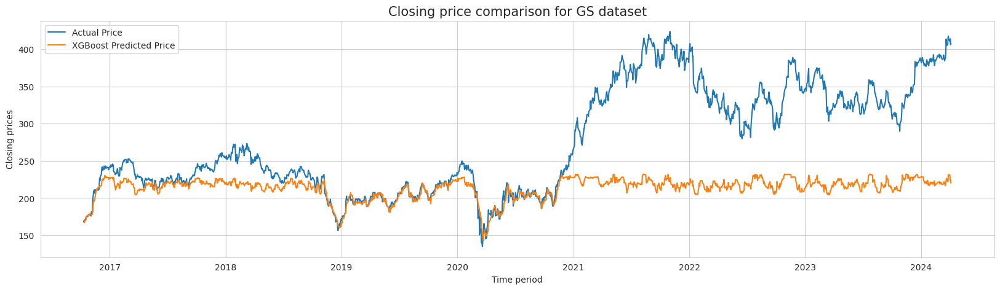

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize = (20,5))

plt.plot(y_frame)



plt.xlabel('Time period')
plt.ylabel('Closing prices')
plt.legend(['Actual Price', 'XGBoost Predicted Price'])
plt.title('Closing price comparison for GS dataset', fontsize = 15)

## Polynomial

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
import numpy as np
# conduct Polynomial Regression
poly = PolynomialFeatures(degree=1)
X_train_poly = poly.fit_transform(X_train_scaled)
X_test_poly = poly.transform(X_test_scaled)
poly_reg = LinearRegression()
poly_reg.fit(X_train_poly, y_train)
poly_predictions_test = poly_reg.predict(X_test_poly)
poly_predictions_test_actual = y_test
poly_predictions_train = poly_reg.predict(X_train_poly)
poly_predictions_train_actual = y_train



In [ ]:
# Train and test scores
train_mse = mean_squared_error(poly_predictions_train_actual, poly_predictions_train)
test_mse = mean_squared_error(poly_predictions_test_actual, poly_predictions_test)

train_r2 = r2_score(poly_predictions_train_actual, poly_predictions_train)
test_r2 = r2_score(poly_predictions_test_actual, poly_predictions_test)


train_mae = mean_absolute_error(poly_predictions_train_actual, poly_predictions_train)
test_mae = mean_absolute_error(poly_predictions_test_actual, poly_predictions_test)

train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)

train_r2 = r2_score(poly_predictions_train_actual,  poly_predictions_train)
test_r2 = r2_score(poly_predictions_test_actual,poly_predictions_test)

print('Train Root Mean Squared Error:', train_rmse)
print('Test Rooot Mean Squared Error:', test_rmse)
print('Train Mean Absolute Error:', train_mae)
print('Test Mean Absolute Error:', test_mae)
print('Train R-squared:', train_r2)
print('Test R-squared:', test_r2)


Train Root Mean Squared Error: 3.5450430770816346
Test Rooot Mean Squared Error: 6.49751895854014
Train Mean Absolute Error: 2.5250568765920764
Test Mean Absolute Error: 4.75499089627538
Train R-squared: 0.9934701823878588
Test R-squared: 0.9915268672476669


In [ ]:
y3=pd.DataFrame(poly_predictions_test)
y3.rename(columns={0: 'Polynomial Predicted Price'}, inplace=True)
y3.index = y1.index

In [ ]:
y_frame=pd.merge(y_frame,y3,left_index=True, right_index=True)

In [ ]:
y_frame

,price_tomorrow,XGBoost Predicted Price,Polynomial Predicted Price
Date,,,
2016-10-11,169.300003,169.661469,167.909871
2016-10-12,167.419998,169.552979,168.656972
2016-10-13,170.520004,167.108185,167.645605
2016-10-14,169.000000,170.084076,169.472220
2016-10-17,172.630005,169.740997,169.415214
...,...,...,...
2024-03-28,413.510010,231.681244,410.764860
2024-04-01,410.149994,230.796234,410.785689
2024-04-02,414.000000,223.363693,410.213228


Text(0.5, 1.0, 'Closing price comparison for GS dataset')

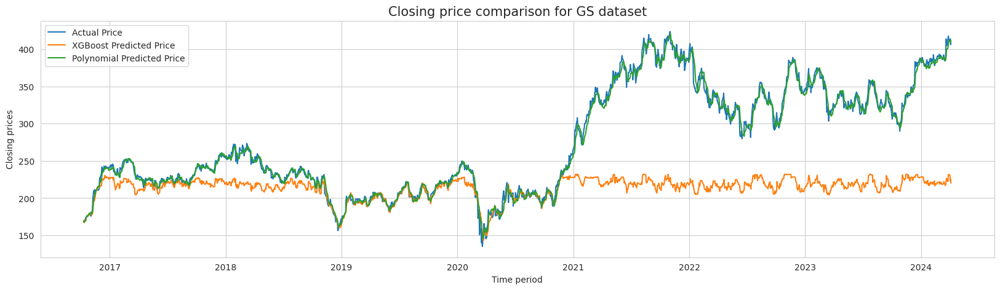

In [ ]:
# Plot to compare the true value and predicted result
import matplotlib.pyplot as plt

plt.figure(figsize = (20,5))

plt.plot(y_frame)



plt.xlabel('Time period')
plt.ylabel('Closing prices')
plt.legend(['Actual Price', 'XGBoost Predicted Price','Polynomial Predicted Price'])
plt.title('Closing price comparison for GS dataset', fontsize = 15)

# Neural Network

## LSTM

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import LSTM, Dense, BatchNormalization
from keras.initializers import he_normal
from keras.callbacks import EarlyStopping
import numpy as np
from tensorflow.keras.layers import LeakyReLU

In [ ]:
stock_data_nn=stock_data
stock_data_nn['price_tomorrow'] = stock_data_nn['Close'].shift(-1)
stock_data_nn=stock_data_nn.dropna()

#### basic model

In [ ]:
#Basic LSTM model
features = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'RSI', 'SMA', 'OBV', 'MACD', 'MACD_signal', 'MACD_diff']

#Standardize data
scaler = MinMaxScaler()
stock_data_nn[features] = scaler.fit_transform(stock_data_nn[features])

X = stock_data_nn[features].values
y = stock_data_nn['price_tomorrow'].values


time_window = 100

#Use windows, create inputs for NN model
X_data, y_data = [], []
for i in range(len(stock_data_nn) - time_window):
    X_data.append(X[i:i + time_window])
    y_data.append(y[i + time_window - 1])

X_data, y_data = np.array(X_data), np.array(y_data)


#Train test split
split_index = int(len(X_data) * 0.7)
X_train, X_test = X_data[:split_index], X_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]

#Model building
model = Sequential()
model.add(LSTM(units=100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(BatchNormalization())
model.add(LSTM(units=64, kernel_initializer=he_normal(seed=None)))
model.add(BatchNormalization())
model.add(Dense(units=1, kernel_initializer=he_normal(seed=None)))

model.compile(optimizer='adam', loss='mean_squared_error',metrics=['mae'])



early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1, callbacks=[early_stopping], shuffle=False)

test_loss = model.evaluate(X_test, y_test)

print(f'Test Loss: {test_loss}')

# Initialize an empty list to store predictions
predictions = []

# Iterate through each sequence in the test data
for sequence in X_test:
    # Reshape the sequence to match the input shape of the model
    sequence = sequence.reshape(1, sequence.shape[0], sequence.shape[1])
    # Predict the next value for this sequence
    prediction = model.predict(sequence)
    # Append the prediction to the list of predictions
    predictions.append(prediction[0, 0])  # Assuming a single output neuron

# Convert the list of predictions to a numpy array
predictions = np.array(predictions)



<ipython-input-39-de4476a4ac3a>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
122/122 [==============================] - 37s 252ms/step - loss: 18287.4258 - mae: 128.6049 - val_loss: 30352.8359 - val_mae: 173.0361
Epoch 2/100
122/122 [==============================] - 17s 141ms/step - loss: 17096.5215 - mae: 124.1275 - val_loss: 27855.0176 - val_mae: 165.6826
Epoch 3/100
122/122 [==============================] - 17s 137ms/step - loss: 14989.2988 - mae: 115.5394 - val_loss: 23170.9531 - val_mae: 150.9811
Epoch 4/100
122/122 [==============================] - 17s 135ms/step - loss: 12296.4619 - mae: 103.3966 - val_loss: 17800.5703 - val_mae: 132.3425
Epoch 5/100
122/122 [==============================] - 16s 135ms/step - loss: 9460.7861 - mae: 88.7326 - val_loss: 10340.1943 - val_mae: 100.7941
Epoch 6/100
122/122 [==============================] - 18s 146ms/step - loss: 6885.2847 - mae: 72.8021 - val_loss: 4990.3794 - val_mae: 70.0577
Epoch 7/100
122/122 [==============================] - 17s 139ms/step - loss: 4841.0117 - mae: 57.0346 - val_loss: 715

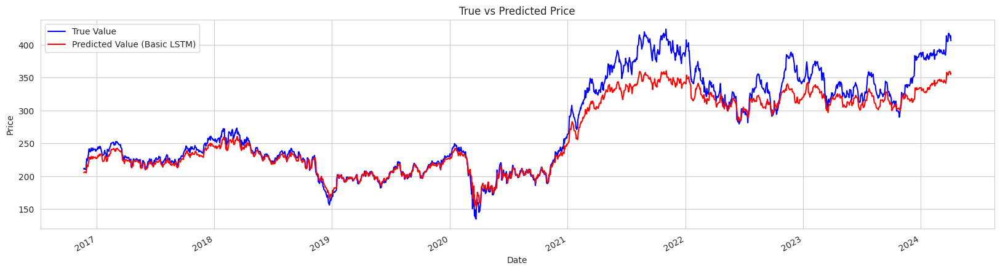

In [ ]:
dates = stock_data_nn.index
dates = pd.to_datetime(dates)
test_dates = dates[-len(predictions):len(stock_data_nn)]

import matplotlib.pyplot as plt

plt.figure(figsize = (20,5))
plt.plot(test_dates, y_test, label='True Value', color='blue')
plt.plot(test_dates, predictions, label='Predicted Value (Basic LSTM)', color='red')

plt.legend()
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('True vs Predicted Price')

plt.gcf().autofmt_xdate()


plt.show()

In [ ]:
test_r2 = r2_score(y_test,predictions)
rmse = np.sqrt(np.mean(np.square(predictions - y_test)))
test_mae = mean_absolute_error(y_test, predictions)

print(f'Test R-squared:', test_r2)
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'Test MAE: {test_mae}')

Test R-squared: 0.9021167243858311
Root Mean Squared Error (RMSE): 21.945576473530064
Test MAE: 15.048429246082677


#### with leaky relu

In [ ]:
#Basic model with Leaky relu

In [ ]:
features = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'RSI', 'SMA', 'OBV', 'MACD', 'MACD_signal', 'MACD_diff']


scaler = MinMaxScaler()
stock_data_nn[features] = scaler.fit_transform(stock_data_nn[features])

X = stock_data_nn[features].values
y = stock_data_nn['price_tomorrow'].values


time_window = 100


X_data, y_data = [], []
for i in range(len(stock_data_nn) - time_window):
    X_data.append(X[i:i + time_window])
    y_data.append(y[i + time_window - 1])

X_data, y_data = np.array(X_data), np.array(y_data)



split_index = int(len(X_data) * 0.7)
X_train, X_test = X_data[:split_index], X_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]


model = Sequential()
model.add(LSTM(units=100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(BatchNormalization())
model.add(LeakyReLU(alpha=0.1))  # Adding Leaky ReLU activation
model.add(LSTM(units=64, kernel_initializer=he_normal(seed=None)))
model.add(BatchNormalization())
model.add(LeakyReLU(alpha=0.1))  # Adding Leaky ReLU activation
model.add(Dense(units=1, kernel_initializer=he_normal(seed=None)))

model.compile(optimizer='adam', loss='mean_squared_error',metrics=['mae'])



early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1, callbacks=[early_stopping], shuffle=False)

test_loss = model.evaluate(X_test, y_test)

print(f'Test Loss: {test_loss}')

# Initialize an empty list to store predictions
predictions_lrl = []

# Iterate through each sequence in the test data
for sequence in X_test:
    # Reshape the sequence to match the input shape of the model
    sequence = sequence.reshape(1, sequence.shape[0], sequence.shape[1])
    # Predict the next value for this sequence
    prediction = model.predict(sequence)
    # Append the prediction to the list of predictions
    predictions_lrl.append(prediction[0, 0])  # Assuming a single output neuron

# Convert the list of predictions to a numpy array
predictions_lrl = np.array(predictions_lrl)

<ipython-input-43-65973d604624>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
122/122 [==============================] - 21s 140ms/step - loss: 17597.1309 - mae: 126.0026 - val_loss: 30839.6836 - val_mae: 174.4359
Epoch 2/100
122/122 [==============================] - 17s 142ms/step - loss: 16130.7148 - mae: 120.0904 - val_loss: 28493.3477 - val_mae: 167.5774
Epoch 3/100
122/122 [==============================] - 16s 134ms/step - loss: 14047.5342 - mae: 111.2452 - val_loss: 24854.2656 - val_mae: 156.3083
Epoch 4/100
122/122 [==============================] - 17s 136ms/step - loss: 11955.4531 - mae: 101.4205 - val_loss: 11495.0742 - val_mae: 105.1465
Epoch 5/100
122/122 [==============================] - 18s 150ms/step - loss: 9211.6816 - mae: 87.0543 - val_loss: 9237.1826 - val_mae: 94.2882
Epoch 6/100
122/122 [==============================] - 16s 135ms/step - loss: 6828.3774 - mae: 72.1670 - val_loss: 8827.5010 - val_mae: 92.3775
Epoch 7/100
122/122 [==============================] - 16s 135ms/step - loss: 4963.4238 - mae: 57.7676 - val_loss: 10044

In [ ]:
#Test scores
test_r2 = r2_score(y_test,predictions_lrl)
rmse = np.sqrt(np.mean(np.square(predictions_lrl - y_test)))
test_mae = mean_absolute_error(y_test, predictions_lrl)

print(f'Test R-squared:', test_r2)
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'Test MAE: {test_mae}')

Test R-squared: -2.282943378950425
Root Mean Squared Error (RMSE): 127.09382272242892
Test MAE: 103.02169486719383


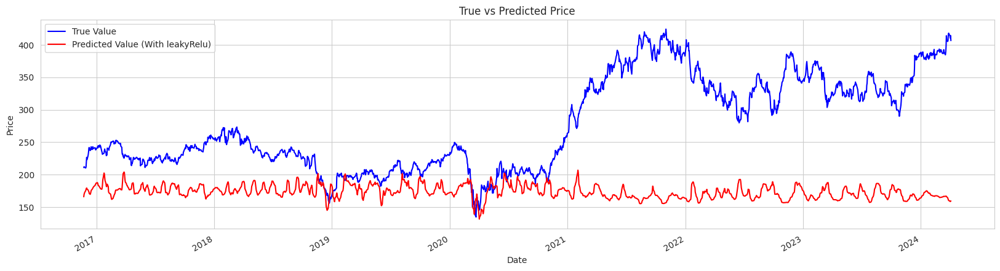

In [ ]:
#Plot the predicted result
dates = stock_data_nn.index
dates = pd.to_datetime(dates)
test_dates = dates[-len(predictions_lrl):len(stock_data_nn)]

import matplotlib.pyplot as plt

plt.figure(figsize = (20,5))
plt.plot(test_dates, y_test, label='True Value', color='blue')
plt.plot(test_dates, predictions_lrl, label='Predicted Value (With leakyRelu)', color='red')

plt.legend()
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('True vs Predicted Price')

plt.gcf().autofmt_xdate()


plt.show()

* From the result we can see it is inappropriate to use leakyReLu.

#### wandb

In [ ]:
pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.8/266.8 kB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.1 MB/s eta 0:00:00


In [ ]:
features = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'RSI', 'SMA', 'OBV', 'MACD', 'MACD_signal', 'MACD_diff']


scaler = MinMaxScaler()
stock_data_nn[features] = scaler.fit_transform(stock_data_nn[features])

X = stock_data_nn[features].values
y = stock_data_nn['price_tomorrow'].values


time_window = 100


X_data, y_data = [], []
for i in range(len(stock_data_nn) - time_window):
    X_data.append(X[i:i + time_window])
    y_data.append(y[i + time_window - 1])

X_data, y_data = np.array(X_data), np.array(y_data)



split_index = int(len(X_data) * 0.7)
X_train, X_test = X_data[:split_index], X_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]


<ipython-input-47-e79c4cf5d556>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
split_index = int(len(X_data) * 0.6)
X_train, X_val = X_train[:split_index], X_train[split_index:]
y_train, y_val = y_train[:split_index], y_train[split_index:]

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
import wandb
from wandb.keras import WandbMetricsLogger, WandbCallback
import keras

wandb.login()

sweep_config= {
    'method': 'grid',
    'parameters':{'learning_rate': {'values': [1e-2, 1e-3, 1e-4]},
                  'batch_size': {'values': [32, 64, 128]}
    }
}

def main():

    run = wandb.init()
    config = wandb.config

    keras.backend.clear_session()

    model = Sequential()
    model.add(LSTM(units=100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(BatchNormalization())
    model.add(LSTM(units=64, kernel_initializer=he_normal(seed=None)))
    model.add(BatchNormalization())
    model.add(Dense(units=1, kernel_initializer=he_normal(seed=None)))


    model.compile(optimizer=Adam(learning_rate=config.learning_rate),
              loss='mean_squared_error', metrics=['mae']
              )

    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    model.fit(X_train, y_train, epochs=100, batch_size=config.batch_size, validation_data=(X_val, y_val), callbacks=[WandbCallback(), WandbMetricsLogger(), early_stopping], shuffle=False)




    loss = model.evaluate(X_test, y_test)
    wandb.run.summary["test_loss"] = loss

    predictions_ft = []

    for sequence in X_test:

        sequence = sequence.reshape(1, sequence.shape[0], sequence.shape[1])

        prediction = model.predict(sequence)

        predictions_ft.append(prediction[0, 0])

    predictions_ft = np.array(predictions_ft)

    test_rmse = np.sqrt(np.mean(np.square(predictions_ft - y_test)))
    test_r2 = r2_score(y_test,predictions_ft)
    test_mae = mean_absolute_error(y_test, predictions_ft)
    wandb.log({'test_rmse': rmse , 'test_mae': test_mae, 'test_r2': test_r2})

sweep_id = wandb.sweep(sweep_config, project="BA865_Group_project_Final")

wandb.agent(sweep_id, main)

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Create sweep with ID: u6qofj6b
Sweep URL: https://wandb.ai/mxzhao0108/BA865_Group_project_Final/sweeps/u6qofj6b


wandb: Agent Starting Run: h5pbjsyu with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.01
wandb: Currently logged in as: mxzhao (mxzhao0108). Use `wandb login --relogin` to force relogin


wandb: WARNING The save_model argument by default saves the model in the HDF5 format that cannot save custom objects like subclassed models and custom layers. This behavior will be deprecated in a future release in favor of the SavedModel format. Meanwhile, the HDF5 model is saved as W&B files and the SavedModel as W&B Artifacts.


Epoch 1/100
116/116 [==============================] - ETA: 0s - loss: 8128.8306 - mae: 79.8805

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164125-h5pbjsyu/files/model-best)... Done. 0.0s


116/116 [==============================] - 32s 227ms/step - loss: 8128.8306 - mae: 79.8805 - val_loss: 2945.8777 - val_mae: 51.3129
Epoch 2/100
116/116 [==============================] - ETA: 0s - loss: 1898.9171 - mae: 34.5989

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164125-h5pbjsyu/files/model-best)... Done. 0.0s


116/116 [==============================] - 26s 226ms/step - loss: 1898.9171 - mae: 34.5989 - val_loss: 1447.0825 - val_mae: 33.8582
Epoch 3/100
116/116 [==============================] - 18s 155ms/step - loss: 2052.8049 - mae: 36.3640 - val_loss: 2904.8054 - val_mae: 51.3030
Epoch 4/100
116/116 [==============================] - 17s 144ms/step - loss: 2052.6091 - mae: 36.3417 - val_loss: 8984.2520 - val_mae: 93.8354
Epoch 5/100
116/116 [==============================] - 17s 145ms/step - loss: 2052.5762 - mae: 36.3358 - val_loss: 2173.9001 - val_mae: 45.3612
Epoch 6/100
116/116 [==============================] - 18s 155ms/step - loss: 2051.7065 - mae: 36.3215 - val_loss: 1710.1910 - val_mae: 39.7019
Epoch 7/100
1/1 [==============================] - 0s 44ms/step


epoch,▁▂▃▅▆▇█
epoch/epoch,▁▂▃▅▆▇█
epoch/learning_rate,▁▁▁▁▁▁▁
epoch/loss,█▁▁▁▁▁▁
epoch/mae,█▁▁▁▁▁▁
epoch/val_loss,▂▁▂▄▁▁█
epoch/val_mae,▂▁▂▅▂▁█
loss,█▁▁▁▁▁▁
mae,█▁▁▁▁▁▁
test_mae,▁
test_r2,▁


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: qulpiv4t with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.001


Epoch 1/100
116/116 [==============================] - ETA: 0s - loss: 17574.6680 - mae: 125.9929

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164834-qulpiv4t/files/model-best)... Done. 0.0s


116/116 [==============================] - 33s 244ms/step - loss: 17574.6680 - mae: 125.9929 - val_loss: 30957.9160 - val_mae: 175.0616
Epoch 2/100
116/116 [==============================] - ETA: 0s - loss: 16496.8652 - mae: 121.8461

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164834-qulpiv4t/files/model-best)... Done. 0.0s


116/116 [==============================] - 27s 232ms/step - loss: 16496.8652 - mae: 121.8461 - val_loss: 28242.8711 - val_mae: 167.1374
Epoch 3/100
116/116 [==============================] - ETA: 0s - loss: 14612.4033 - mae: 114.0357

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164834-qulpiv4t/files/model-best)... Done. 0.0s


116/116 [==============================] - 28s 242ms/step - loss: 14612.4033 - mae: 114.0357 - val_loss: 24884.6289 - val_mae: 156.8235
Epoch 4/100
116/116 [==============================] - ETA: 0s - loss: 12179.8555 - mae: 102.9607

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164834-qulpiv4t/files/model-best)... Done. 0.0s


116/116 [==============================] - 25s 220ms/step - loss: 12179.8555 - mae: 102.9607 - val_loss: 19007.9219 - val_mae: 136.9559
Epoch 5/100
116/116 [==============================] - ETA: 0s - loss: 9568.2275 - mae: 89.4750

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164834-qulpiv4t/files/model-best)... Done. 0.0s


116/116 [==============================] - 26s 225ms/step - loss: 9568.2275 - mae: 89.4750 - val_loss: 13230.5303 - val_mae: 114.2535
Epoch 6/100
116/116 [==============================] - ETA: 0s - loss: 7130.3662 - mae: 74.6428

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164834-qulpiv4t/files/model-best)... Done. 0.0s


116/116 [==============================] - 27s 235ms/step - loss: 7130.3662 - mae: 74.6428 - val_loss: 9010.9268 - val_mae: 94.3799
Epoch 7/100
116/116 [==============================] - ETA: 0s - loss: 5122.6562 - mae: 59.6239

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164834-qulpiv4t/files/model-best)... Done. 0.0s


116/116 [==============================] - 26s 223ms/step - loss: 5122.6562 - mae: 59.6239 - val_loss: 3063.5356 - val_mae: 54.7638
Epoch 8/100
116/116 [==============================] - 17s 146ms/step - loss: 3659.6665 - mae: 46.7218 - val_loss: 4232.9321 - val_mae: 64.7901
Epoch 9/100
116/116 [==============================] - ETA: 0s - loss: 2720.0117 - mae: 38.5049

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164834-qulpiv4t/files/model-best)... Done. 0.0s


116/116 [==============================] - 27s 231ms/step - loss: 2720.0117 - mae: 38.5049 - val_loss: 1214.5957 - val_mae: 34.5271
Epoch 10/100
116/116 [==============================] - 18s 154ms/step - loss: 2189.8967 - mae: 35.5494 - val_loss: 2980.0352 - val_mae: 54.3090
Epoch 11/100
116/116 [==============================] - ETA: 0s - loss: 1928.0968 - mae: 34.8935

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164834-qulpiv4t/files/model-best)... Done. 0.0s


116/116 [==============================] - 25s 219ms/step - loss: 1928.0968 - mae: 34.8935 - val_loss: 75.8042 - val_mae: 7.1965
Epoch 12/100
116/116 [==============================] - 17s 145ms/step - loss: 1815.7192 - mae: 35.1404 - val_loss: 624.3650 - val_mae: 24.5888
Epoch 13/100
116/116 [==============================] - 17s 147ms/step - loss: 1775.3127 - mae: 35.5698 - val_loss: 195.5383 - val_mae: 12.9875
Epoch 14/100
116/116 [==============================] - 18s 154ms/step - loss: 1764.7306 - mae: 35.9215 - val_loss: 353.5476 - val_mae: 18.1614
Epoch 15/100
116/116 [==============================] - 17s 147ms/step - loss: 1764.8085 - mae: 36.1758 - val_loss: 168.3436 - val_mae: 12.4525
Epoch 16/100
116/116 [==============================] - ETA: 0s - loss: 1767.7698 - mae: 36.3444

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_164834-qulpiv4t/files/model-best)... Done. 0.0s


116/116 [==============================] - 26s 228ms/step - loss: 1767.7698 - mae: 36.3444 - val_loss: 12.2788 - val_mae: 2.7572
Epoch 17/100
116/116 [==============================] - 17s 148ms/step - loss: 1770.5833 - mae: 36.4519 - val_loss: 17.7955 - val_mae: 3.3375
Epoch 18/100
116/116 [==============================] - 18s 157ms/step - loss: 1772.8308 - mae: 36.5185 - val_loss: 659.8882 - val_mae: 25.2934
Epoch 19/100
116/116 [==============================] - 16s 142ms/step - loss: 1774.9655 - mae: 36.5614 - val_loss: 117.8553 - val_mae: 10.0838
Epoch 20/100
116/116 [==============================] - 17s 146ms/step - loss: 1775.6963 - mae: 36.5862 - val_loss: 15.0763 - val_mae: 3.1207
Epoch 21/100
1/1 [==============================] - 0s 51ms/step


epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,██▇▆▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/mae,██▇▆▅▄▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,█▇▇▅▄▃▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁
epoch/val_mae,██▇▆▆▅▃▄▂▃▁▂▁▂▁▁▁▂▁▁▁
loss,██▇▆▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
mae,██▇▆▅▄▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁
test_mae,▁
test_r2,▁


wandb: Agent Starting Run: 437c5ow9 with config:
wandb: 	batch_size: 32
wandb: 	learning_rate: 0.0001


Epoch 1/100
116/116 [==============================] - ETA: 0s - loss: 17845.4355 - mae: 126.9341

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 36s 253ms/step - loss: 17845.4355 - mae: 126.9341 - val_loss: 31999.1699 - val_mae: 178.0077
Epoch 2/100
116/116 [==============================] - ETA: 0s - loss: 17808.4434 - mae: 126.8092

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 27s 238ms/step - loss: 17808.4434 - mae: 126.8092 - val_loss: 31826.8203 - val_mae: 177.5556
Epoch 3/100
116/116 [==============================] - ETA: 0s - loss: 17770.1406 - mae: 126.6685

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 28s 246ms/step - loss: 17770.1406 - mae: 126.6685 - val_loss: 31339.0508 - val_mae: 176.2416
Epoch 4/100
116/116 [==============================] - ETA: 0s - loss: 17724.9512 - mae: 126.4990

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 28s 238ms/step - loss: 17724.9512 - mae: 126.4990 - val_loss: 30419.4707 - val_mae: 173.7111
Epoch 5/100
116/116 [==============================] - ETA: 0s - loss: 17671.5684 - mae: 126.2960

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 26s 226ms/step - loss: 17671.5684 - mae: 126.2960 - val_loss: 29019.8828 - val_mae: 169.7197
Epoch 6/100
116/116 [==============================] - ETA: 0s - loss: 17609.7207 - mae: 126.0582

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 27s 236ms/step - loss: 17609.7207 - mae: 126.0582 - val_loss: 27942.5898 - val_mae: 166.5066
Epoch 7/100
116/116 [==============================] - ETA: 0s - loss: 17539.3262 - mae: 125.7858

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 27s 232ms/step - loss: 17539.3262 - mae: 125.7858 - val_loss: 27075.4785 - val_mae: 163.8990
Epoch 8/100
116/116 [==============================] - ETA: 0s - loss: 17460.8887 - mae: 125.4795

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 29s 248ms/step - loss: 17460.8887 - mae: 125.4795 - val_loss: 26869.4180 - val_mae: 163.2413
Epoch 9/100
116/116 [==============================] - ETA: 0s - loss: 17374.5234 - mae: 125.1403

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 28s 242ms/step - loss: 17374.5234 - mae: 125.1403 - val_loss: 26006.2559 - val_mae: 160.6416
Epoch 10/100
116/116 [==============================] - ETA: 0s - loss: 17280.3984 - mae: 124.7696

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 26s 226ms/step - loss: 17280.3984 - mae: 124.7696 - val_loss: 25730.7539 - val_mae: 159.8086
Epoch 11/100
116/116 [==============================] - ETA: 0s - loss: 17179.3105 - mae: 124.3684

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 29s 247ms/step - loss: 17179.3105 - mae: 124.3684 - val_loss: 25269.6055 - val_mae: 158.3663
Epoch 12/100
116/116 [==============================] - ETA: 0s - loss: 17071.2637 - mae: 123.9379

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 27s 229ms/step - loss: 17071.2637 - mae: 123.9379 - val_loss: 24700.5918 - val_mae: 156.5718
Epoch 13/100
116/116 [==============================] - 19s 162ms/step - loss: 16956.8652 - mae: 123.4792 - val_loss: 24858.5469 - val_mae: 157.1094
Epoch 14/100
116/116 [==============================] - ETA: 0s - loss: 16836.1035 - mae: 122.9934

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 28s 241ms/step - loss: 16836.1035 - mae: 122.9934 - val_loss: 24376.0469 - val_mae: 155.5832
Epoch 15/100
116/116 [==============================] - 18s 156ms/step - loss: 16709.5957 - mae: 122.4816 - val_loss: 24897.1953 - val_mae: 157.2103
Epoch 16/100
116/116 [==============================] - ETA: 0s - loss: 16577.5781 - mae: 121.9446

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_170125-437c5ow9/files/model-best)... Done. 0.0s


116/116 [==============================] - 28s 244ms/step - loss: 16577.5781 - mae: 121.9446 - val_loss: 24249.8301 - val_mae: 155.2229
Epoch 17/100
116/116 [==============================] - 17s 149ms/step - loss: 16440.4082 - mae: 121.3833 - val_loss: 26026.5488 - val_mae: 160.6774
Epoch 18/100
116/116 [==============================] - 17s 147ms/step - loss: 16298.1699 - mae: 120.7988 - val_loss: 24869.1758 - val_mae: 157.1987
Epoch 19/100
116/116 [==============================] - 18s 157ms/step - loss: 16151.2148 - mae: 120.1916 - val_loss: 26246.8320 - val_mae: 161.4165
Epoch 20/100
116/116 [==============================] - 18s 152ms/step - loss: 15999.8047 - mae: 119.5625 - val_loss: 25381.2480 - val_mae: 158.7583
Epoch 21/100
1/1 [==============================] - 0s 46ms/step


epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
epoch/epoch,▁▁▂▂▂▃▃▃▄▄▅▅▅▆▆▆▇▇▇██
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,████▇▇▇▇▆▆▆▅▅▄▄▄▃▃▂▂▁
epoch/mae,████▇▇▇▇▆▆▆▅▅▅▄▄▃▃▂▂▁
epoch/val_loss,██▇▇▅▄▄▃▃▂▂▁▂▁▂▁▃▂▃▂▃
epoch/val_mae,██▇▇▅▄▄▃▃▂▂▁▂▁▂▁▃▂▃▂▃
loss,████▇▇▇▇▆▆▆▅▅▄▄▄▃▃▂▂▁
mae,████▇▇▇▇▆▆▆▅▅▅▄▄▃▃▂▂▁
test_mae,▁
test_r2,▁


wandb: Agent Starting Run: uk4d4001 with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.01


Epoch 1/100
58/58 [==============================] - ETA: 0s - loss: 14819.8027 - mae: 115.8129

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_171514-uk4d4001/files/model-best)... Done. 0.0s


58/58 [==============================] - 38s 542ms/step - loss: 14819.8027 - mae: 115.8129 - val_loss: 19564.4922 - val_mae: 138.7375
Epoch 2/100
58/58 [==============================] - ETA: 0s - loss: 4388.9834 - mae: 56.0277

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_171514-uk4d4001/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 471ms/step - loss: 4388.9834 - mae: 56.0277 - val_loss: 3230.9155 - val_mae: 53.9914
Epoch 3/100
58/58 [==============================] - ETA: 0s - loss: 1781.3169 - mae: 34.6976

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_171514-uk4d4001/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 485ms/step - loss: 1781.3169 - mae: 34.6976 - val_loss: 1446.6116 - val_mae: 33.7045
Epoch 4/100
58/58 [==============================] - 17s 300ms/step - loss: 2076.7976 - mae: 38.7836 - val_loss: 1555.1010 - val_mae: 35.2959
Epoch 5/100
58/58 [==============================] - ETA: 0s - loss: 2060.6599 - mae: 38.6125

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_171514-uk4d4001/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 451ms/step - loss: 2060.6599 - mae: 38.6125 - val_loss: 1220.9517 - val_mae: 30.4734
Epoch 6/100
58/58 [==============================] - 18s 314ms/step - loss: 2061.0256 - mae: 38.6113 - val_loss: 2070.5662 - val_mae: 42.2534
Epoch 7/100
58/58 [==============================] - 18s 306ms/step - loss: 2059.7598 - mae: 38.6448 - val_loss: 5390.6665 - val_mae: 71.7602
Epoch 8/100
58/58 [==============================] - 19s 325ms/step - loss: 2058.7888 - mae: 38.5784 - val_loss: 3925.7710 - val_mae: 60.6669
Epoch 9/100
58/58 [==============================] - 17s 297ms/step - loss: 2057.9666 - mae: 38.6093 - val_loss: 1305.3962 - val_mae: 33.5744
Epoch 10/100
58/58 [==============================] - ETA: 0s - loss: 2056.7527 - mae: 38.6152

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_171514-uk4d4001/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 472ms/step - loss: 2056.7527 - mae: 38.6152 - val_loss: 134.7701 - val_mae: 9.6810
Epoch 11/100
58/58 [==============================] - 19s 322ms/step - loss: 2055.5132 - mae: 38.5713 - val_loss: 196.6289 - val_mae: 11.9223
Epoch 12/100
58/58 [==============================] - 17s 285ms/step - loss: 2055.3760 - mae: 38.5662 - val_loss: 5551.3296 - val_mae: 74.2171
Epoch 13/100
58/58 [==============================] - 17s 297ms/step - loss: 2055.0557 - mae: 38.5686 - val_loss: 807.0088 - val_mae: 27.9318
Epoch 14/100
58/58 [==============================] - 18s 319ms/step - loss: 2055.8589 - mae: 38.5619 - val_loss: 25712.5000 - val_mae: 160.1742
Epoch 15/100
1/1 [==============================] - 0s 71ms/step


epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
epoch/epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/mae,█▃▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,▆▂▁▁▁▁▂▂▁▁▁▂▁▇█
epoch/val_mae,▇▃▂▂▂▂▄▃▂▁▁▄▂▇█
loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁
mae,█▃▁▁▁▁▁▁▁▁▁▁▁▁▁
test_mae,▁
test_r2,▁


wandb: Agent Starting Run: 58cguhm0 with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.001


Epoch 1/100
58/58 [==============================] - ETA: 0s - loss: 17737.7930 - mae: 126.6393

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 34s 461ms/step - loss: 17737.7930 - mae: 126.6393 - val_loss: 31476.8496 - val_mae: 176.5350
Epoch 2/100
58/58 [==============================] - ETA: 0s - loss: 17437.1934 - mae: 125.5737

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 477ms/step - loss: 17437.1934 - mae: 125.5737 - val_loss: 30474.8301 - val_mae: 173.6834
Epoch 3/100
58/58 [==============================] - ETA: 0s - loss: 16951.1875 - mae: 123.7007

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 458ms/step - loss: 16951.1875 - mae: 123.7007 - val_loss: 29515.3516 - val_mae: 170.8983
Epoch 4/100
58/58 [==============================] - 17s 302ms/step - loss: 16243.5195 - mae: 120.8687 - val_loss: 29902.5566 - val_mae: 172.0556
Epoch 5/100
58/58 [==============================] - ETA: 0s - loss: 15327.0557 - mae: 117.0753

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 29s 505ms/step - loss: 15327.0557 - mae: 117.0753 - val_loss: 27763.4531 - val_mae: 165.7443
Epoch 6/100
58/58 [==============================] - ETA: 0s - loss: 14235.9229 - mae: 112.3766

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 455ms/step - loss: 14235.9229 - mae: 112.3766 - val_loss: 25285.7344 - val_mae: 158.1768
Epoch 7/100
58/58 [==============================] - ETA: 0s - loss: 13018.8848 - mae: 106.8697

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 449ms/step - loss: 13018.8848 - mae: 106.8697 - val_loss: 23008.1582 - val_mae: 150.8497
Epoch 8/100
58/58 [==============================] - ETA: 0s - loss: 11723.7344 - mae: 100.6657

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 465ms/step - loss: 11723.7344 - mae: 100.6657 - val_loss: 20106.4629 - val_mae: 141.0749
Epoch 9/100
58/58 [==============================] - ETA: 0s - loss: 10398.9180 - mae: 93.8895

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 25s 439ms/step - loss: 10398.9180 - mae: 93.8895 - val_loss: 17345.2734 - val_mae: 131.0454
Epoch 10/100
58/58 [==============================] - ETA: 0s - loss: 9093.7129 - mae: 86.6806

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 25s 440ms/step - loss: 9093.7129 - mae: 86.6806 - val_loss: 13509.4375 - val_mae: 115.6636
Epoch 11/100
58/58 [==============================] - ETA: 0s - loss: 7848.2129 - mae: 79.1839

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 468ms/step - loss: 7848.2129 - mae: 79.1839 - val_loss: 10078.9072 - val_mae: 99.9210
Epoch 12/100
58/58 [==============================] - ETA: 0s - loss: 6698.7759 - mae: 71.5492

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 465ms/step - loss: 6698.7759 - mae: 71.5492 - val_loss: 6703.2451 - val_mae: 81.5336
Epoch 13/100
58/58 [==============================] - ETA: 0s - loss: 5667.7065 - mae: 63.9266

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 489ms/step - loss: 5667.7065 - mae: 63.9266 - val_loss: 5992.2271 - val_mae: 77.1878
Epoch 14/100
58/58 [==============================] - ETA: 0s - loss: 4773.6797 - mae: 56.4836

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 461ms/step - loss: 4773.6797 - mae: 56.4836 - val_loss: 3307.9255 - val_mae: 57.3671
Epoch 15/100
58/58 [==============================] - ETA: 0s - loss: 4019.9141 - mae: 49.9534

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 447ms/step - loss: 4019.9141 - mae: 49.9534 - val_loss: 2710.2546 - val_mae: 51.9227
Epoch 16/100
58/58 [==============================] - ETA: 0s - loss: 3406.2344 - mae: 44.6844

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 481ms/step - loss: 3406.2344 - mae: 44.6844 - val_loss: 2006.9457 - val_mae: 44.5097
Epoch 17/100
58/58 [==============================] - ETA: 0s - loss: 2920.5701 - mae: 40.4413

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 490ms/step - loss: 2920.5701 - mae: 40.4413 - val_loss: 1388.5426 - val_mae: 37.1523
Epoch 18/100
58/58 [==============================] - ETA: 0s - loss: 2549.0229 - mae: 37.6180

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 30s 515ms/step - loss: 2549.0229 - mae: 37.6180 - val_loss: 817.6985 - val_mae: 28.4348
Epoch 19/100
58/58 [==============================] - 19s 322ms/step - loss: 2273.7969 - mae: 35.9493 - val_loss: 819.0308 - val_mae: 28.4835
Epoch 20/100
58/58 [==============================] - ETA: 0s - loss: 2075.9448 - mae: 35.0158

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 452ms/step - loss: 2075.9448 - mae: 35.0158 - val_loss: 389.1243 - val_mae: 19.4696
Epoch 21/100
58/58 [==============================] - 18s 310ms/step - loss: 1937.8586 - mae: 34.6911 - val_loss: 618.8198 - val_mae: 24.6514
Epoch 22/100
58/58 [==============================] - ETA: 0s - loss: 1844.5123 - mae: 34.5967

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 460ms/step - loss: 1844.5123 - mae: 34.5967 - val_loss: 122.8319 - val_mae: 10.7526
Epoch 23/100
58/58 [==============================] - 19s 328ms/step - loss: 1783.4476 - mae: 34.6649 - val_loss: 842.5302 - val_mae: 28.8844
Epoch 24/100
58/58 [==============================] - 18s 304ms/step - loss: 1745.0251 - mae: 34.8327 - val_loss: 170.6161 - val_mae: 12.6757
Epoch 25/100
58/58 [==============================] - ETA: 0s - loss: 1721.0718 - mae: 35.0107

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 467ms/step - loss: 1721.0718 - mae: 35.0107 - val_loss: 116.4301 - val_mae: 10.4258
Epoch 26/100
58/58 [==============================] - ETA: 0s - loss: 1706.1586 - mae: 35.1895

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_172533-58cguhm0/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 446ms/step - loss: 1706.1586 - mae: 35.1895 - val_loss: 7.6224 - val_mae: 2.0893
Epoch 27/100
58/58 [==============================] - 19s 321ms/step - loss: 1698.0236 - mae: 35.3529 - val_loss: 496.5540 - val_mae: 22.1251
Epoch 28/100
58/58 [==============================] - 18s 310ms/step - loss: 1694.2000 - mae: 35.5053 - val_loss: 450.6535 - val_mae: 20.9511
Epoch 29/100
58/58 [==============================] - 17s 294ms/step - loss: 1692.0695 - mae: 35.5967 - val_loss: 19.3966 - val_mae: 3.7132
Epoch 30/100
58/58 [==============================] - 18s 313ms/step - loss: 1691.2147 - mae: 35.6865 - val_loss: 252.9889 - val_mae: 15.6525
Epoch 31/100
1/1 [==============================] - 0s 45ms/step


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,███▇▇▆▆▅▅▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/mae,████▇▇▆▆▆▅▄▄▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_loss,████▇▇▆▅▅▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_mae,█████▇▇▇▆▆▅▄▄▃▃▃▂▂▂▂▂▁▂▁▁▁▂▂▁▂▂
loss,███▇▇▆▆▅▅▄▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
mae,████▇▇▆▆▆▅▄▄▃▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
test_mae,▁
test_r2,▁


wandb: Agent Starting Run: i9shknlm with config:
wandb: 	batch_size: 64
wandb: 	learning_rate: 0.0001


Epoch 1/100
58/58 [==============================] - ETA: 0s - loss: 17841.7383 - mae: 126.9644

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 35s 505ms/step - loss: 17841.7383 - mae: 126.9644 - val_loss: 31996.0488 - val_mae: 177.9943
Epoch 2/100
58/58 [==============================] - ETA: 0s - loss: 17809.1836 - mae: 126.9021

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 460ms/step - loss: 17809.1836 - mae: 126.9021 - val_loss: 31937.4609 - val_mae: 177.8435
Epoch 3/100
58/58 [==============================] - ETA: 0s - loss: 17786.8633 - mae: 126.8399

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 461ms/step - loss: 17786.8633 - mae: 126.8399 - val_loss: 31867.5957 - val_mae: 177.6678
Epoch 4/100
58/58 [==============================] - ETA: 0s - loss: 17765.6719 - mae: 126.7745

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.1s


58/58 [==============================] - 29s 510ms/step - loss: 17765.6719 - mae: 126.7745 - val_loss: 31625.1895 - val_mae: 177.0178
Epoch 5/100
58/58 [==============================] - ETA: 0s - loss: 17744.3945 - mae: 126.7046

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 461ms/step - loss: 17744.3945 - mae: 126.7046 - val_loss: 31187.0020 - val_mae: 175.8229
Epoch 6/100
58/58 [==============================] - ETA: 0s - loss: 17722.4961 - mae: 126.6292

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 480ms/step - loss: 17722.4961 - mae: 126.6292 - val_loss: 30562.9922 - val_mae: 174.0992
Epoch 7/100
58/58 [==============================] - ETA: 0s - loss: 17699.2969 - mae: 126.5473

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 457ms/step - loss: 17699.2969 - mae: 126.5473 - val_loss: 29681.7598 - val_mae: 171.6139
Epoch 8/100
58/58 [==============================] - ETA: 0s - loss: 17674.3945 - mae: 126.4586

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 446ms/step - loss: 17674.3945 - mae: 126.4586 - val_loss: 28781.6230 - val_mae: 169.0333
Epoch 9/100
58/58 [==============================] - ETA: 0s - loss: 17648.0742 - mae: 126.3625

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 485ms/step - loss: 17648.0742 - mae: 126.3625 - val_loss: 27851.1992 - val_mae: 166.3227
Epoch 10/100
58/58 [==============================] - ETA: 0s - loss: 17619.9902 - mae: 126.2586

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 456ms/step - loss: 17619.9902 - mae: 126.2586 - val_loss: 27032.8164 - val_mae: 163.9091
Epoch 11/100
58/58 [==============================] - ETA: 0s - loss: 17590.1074 - mae: 126.1469

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 446ms/step - loss: 17590.1074 - mae: 126.1469 - val_loss: 26517.2773 - val_mae: 162.3976
Epoch 12/100
58/58 [==============================] - ETA: 0s - loss: 17558.2559 - mae: 126.0270

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 495ms/step - loss: 17558.2559 - mae: 126.0270 - val_loss: 25847.3652 - val_mae: 160.3753
Epoch 13/100
58/58 [==============================] - ETA: 0s - loss: 17524.4941 - mae: 125.8990

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 488ms/step - loss: 17524.4941 - mae: 125.8990 - val_loss: 25407.9746 - val_mae: 159.0214
Epoch 14/100
58/58 [==============================] - ETA: 0s - loss: 17488.8008 - mae: 125.7628

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 490ms/step - loss: 17488.8008 - mae: 125.7628 - val_loss: 24555.3027 - val_mae: 156.3662
Epoch 15/100
58/58 [==============================] - ETA: 0s - loss: 17451.2266 - mae: 125.6185

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 460ms/step - loss: 17451.2266 - mae: 125.6185 - val_loss: 24516.6250 - val_mae: 156.2189
Epoch 16/100
58/58 [==============================] - ETA: 0s - loss: 17411.7129 - mae: 125.4661

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 446ms/step - loss: 17411.7129 - mae: 125.4661 - val_loss: 23820.0820 - val_mae: 154.0241
Epoch 17/100
58/58 [==============================] - ETA: 0s - loss: 17370.2949 - mae: 125.3055

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 484ms/step - loss: 17370.2949 - mae: 125.3055 - val_loss: 23549.3398 - val_mae: 153.1404
Epoch 18/100
58/58 [==============================] - ETA: 0s - loss: 17327.0352 - mae: 125.1371

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 25s 439ms/step - loss: 17327.0352 - mae: 125.1371 - val_loss: 22752.9199 - val_mae: 150.5807
Epoch 19/100
58/58 [==============================] - 18s 314ms/step - loss: 17281.9062 - mae: 124.9607 - val_loss: 22908.1836 - val_mae: 151.0747
Epoch 20/100
58/58 [==============================] - ETA: 0s - loss: 17235.0566 - mae: 124.7766

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 459ms/step - loss: 17235.0566 - mae: 124.7766 - val_loss: 21799.2324 - val_mae: 147.4218
Epoch 21/100
58/58 [==============================] - 17s 294ms/step - loss: 17186.2812 - mae: 124.5847 - val_loss: 22345.8047 - val_mae: 149.2489
Epoch 22/100
58/58 [==============================] - ETA: 0s - loss: 17135.9844 - mae: 124.3854

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 27s 469ms/step - loss: 17135.9844 - mae: 124.3854 - val_loss: 20930.8613 - val_mae: 144.4812
Epoch 23/100
58/58 [==============================] - 18s 307ms/step - loss: 17083.6992 - mae: 124.1786 - val_loss: 22304.2480 - val_mae: 149.1194
Epoch 24/100
58/58 [==============================] - ETA: 0s - loss: 17030.0430 - mae: 123.9645

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 28s 475ms/step - loss: 17030.0430 - mae: 123.9645 - val_loss: 20439.8633 - val_mae: 142.8006
Epoch 25/100
58/58 [==============================] - 18s 306ms/step - loss: 16974.3477 - mae: 123.7432 - val_loss: 21283.1191 - val_mae: 145.6732
Epoch 26/100
58/58 [==============================] - ETA: 0s - loss: 16917.3359 - mae: 123.5149

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 457ms/step - loss: 16917.3359 - mae: 123.5149 - val_loss: 19893.6172 - val_mae: 140.8859
Epoch 27/100
58/58 [==============================] - 18s 305ms/step - loss: 16858.5566 - mae: 123.2796 - val_loss: 21023.9199 - val_mae: 144.7752
Epoch 28/100
58/58 [==============================] - ETA: 0s - loss: 16798.4766 - mae: 123.0375

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 29s 500ms/step - loss: 16798.4766 - mae: 123.0375 - val_loss: 19799.7832 - val_mae: 140.5615
Epoch 29/100
58/58 [==============================] - 17s 299ms/step - loss: 16736.6953 - mae: 122.7888 - val_loss: 20931.7598 - val_mae: 144.4534
Epoch 30/100
58/58 [==============================] - ETA: 0s - loss: 16673.6465 - mae: 122.5335

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_174303-i9shknlm/files/model-best)... Done. 0.0s


58/58 [==============================] - 26s 448ms/step - loss: 16673.6465 - mae: 122.5335 - val_loss: 19591.7715 - val_mae: 139.8213
Epoch 31/100
58/58 [==============================] - 21s 365ms/step - loss: 16608.9844 - mae: 122.2717 - val_loss: 20462.8242 - val_mae: 142.8286
Epoch 32/100
58/58 [==============================] - 18s 319ms/step - loss: 16543.0801 - mae: 122.0037 - val_loss: 19718.4883 - val_mae: 140.2655
Epoch 33/100
58/58 [==============================] - 21s 371ms/step - loss: 16475.7734 - mae: 121.7294 - val_loss: 20607.3613 - val_mae: 143.3379
Epoch 34/100
58/58 [==============================] - 18s 311ms/step - loss: 16407.2168 - mae: 121.4490 - val_loss: 19835.2520 - val_mae: 140.6635
Epoch 35/100
1/1 [==============================] - 0s 67ms/step


epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█████▇▇▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
epoch/mae,██████▇▇▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▂▂▂▁▁
epoch/val_loss,█████▇▇▆▆▅▅▅▄▄▄▃▃▃▃▂▃▂▃▁▂▁▂▁▂▁▁▁▂▁▂
epoch/val_mae,█████▇▇▆▆▅▅▅▅▄▄▄▃▃▃▂▃▂▃▂▂▁▂▁▂▁▂▁▂▁▂
loss,█████▇▇▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▁▁
mae,██████▇▇▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▂▂▂▁▁
test_mae,▁
test_r2,▁


wandb: Agent Starting Run: 0va75qq8 with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.01


Epoch 1/100
29/29 [==============================] - ETA: 0s - loss: 16977.3535 - mae: 124.2652

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_180239-0va75qq8/files/model-best)... Done. 0.0s


29/29 [==============================] - 32s 915ms/step - loss: 16977.3535 - mae: 124.2652 - val_loss: 26146.8320 - val_mae: 160.7175
Epoch 2/100
29/29 [==============================] - ETA: 0s - loss: 13287.5127 - mae: 109.1262

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_180239-0va75qq8/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 775ms/step - loss: 13287.5127 - mae: 109.1262 - val_loss: 17895.7715 - val_mae: 132.5893
Epoch 3/100
29/29 [==============================] - ETA: 0s - loss: 7142.8779 - mae: 76.7278

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_180239-0va75qq8/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 771ms/step - loss: 7142.8779 - mae: 76.7278 - val_loss: 6509.8105 - val_mae: 78.6980
Epoch 4/100
29/29 [==============================] - ETA: 0s - loss: 2577.0593 - mae: 37.4865

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_180239-0va75qq8/files/model-best)... Done. 0.0s


29/29 [==============================] - 24s 843ms/step - loss: 2577.0593 - mae: 37.4865 - val_loss: 2115.0393 - val_mae: 42.4541
Epoch 5/100
29/29 [==============================] - ETA: 0s - loss: 1585.7521 - mae: 33.0112

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_180239-0va75qq8/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 772ms/step - loss: 1585.7521 - mae: 33.0112 - val_loss: 577.1219 - val_mae: 19.7415
Epoch 6/100
29/29 [==============================] - 15s 504ms/step - loss: 1728.8552 - mae: 36.7332 - val_loss: 985.8945 - val_mae: 26.6849
Epoch 7/100
29/29 [==============================] - 15s 517ms/step - loss: 1764.2416 - mae: 37.1965 - val_loss: 1062.8373 - val_mae: 27.9031
Epoch 8/100
29/29 [==============================] - 15s 508ms/step - loss: 1758.7145 - mae: 37.0485 - val_loss: 941.5505 - val_mae: 25.9177
Epoch 9/100
29/29 [==============================] - 15s 508ms/step - loss: 1754.9899 - mae: 37.0884 - val_loss: 1058.2853 - val_mae: 27.8977
Epoch 10/100
1/1 [==============================] - 0s 46ms/step


epoch,▁▂▃▃▄▅▆▆▇█
epoch/epoch,▁▂▃▃▄▅▆▆▇█
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▆▄▁▁▁▁▁▁▁
epoch/mae,█▇▄▁▁▁▁▁▁▁
epoch/val_loss,█▆▃▁▁▁▁▁▁▁
epoch/val_mae,█▇▄▂▁▁▁▁▁▂
loss,█▆▄▁▁▁▁▁▁▁
mae,█▇▄▁▁▁▁▁▁▁
test_mae,▁
test_r2,▁


wandb: Agent Starting Run: em3u052d with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.001


Epoch 1/100
29/29 [==============================] - ETA: 0s - loss: 17758.9121 - mae: 126.8474

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 30s 893ms/step - loss: 17758.9121 - mae: 126.8474 - val_loss: 31528.0781 - val_mae: 176.6828
Epoch 2/100
29/29 [==============================] - ETA: 0s - loss: 17631.1074 - mae: 126.4913

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 25s 867ms/step - loss: 17631.1074 - mae: 126.4913 - val_loss: 31165.3613 - val_mae: 175.6579
Epoch 3/100
29/29 [==============================] - ETA: 0s - loss: 17500.7617 - mae: 126.0141

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 24s 852ms/step - loss: 17500.7617 - mae: 126.0141 - val_loss: 31011.1387 - val_mae: 175.2312
Epoch 4/100
29/29 [==============================] - ETA: 0s - loss: 17327.8516 - mae: 125.3606

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 24s 845ms/step - loss: 17327.8516 - mae: 125.3606 - val_loss: 29989.2715 - val_mae: 172.2957
Epoch 5/100
29/29 [==============================] - ETA: 0s - loss: 17106.9609 - mae: 124.5021

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 805ms/step - loss: 17106.9609 - mae: 124.5021 - val_loss: 29544.0645 - val_mae: 171.0111
Epoch 6/100
29/29 [==============================] - 14s 488ms/step - loss: 16827.8594 - mae: 123.4098 - val_loss: 29613.8809 - val_mae: 171.2341
Epoch 7/100
29/29 [==============================] - ETA: 0s - loss: 16488.9941 - mae: 122.0768

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.1s


29/29 [==============================] - 22s 783ms/step - loss: 16488.9941 - mae: 122.0768 - val_loss: 28867.2676 - val_mae: 169.0676
Epoch 8/100
29/29 [==============================] - ETA: 0s - loss: 16092.4932 - mae: 120.4979

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 26s 884ms/step - loss: 16092.4932 - mae: 120.4979 - val_loss: 27912.4531 - val_mae: 166.2265
Epoch 9/100
29/29 [==============================] - ETA: 0s - loss: 15646.6670 - mae: 118.6741

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 741ms/step - loss: 15646.6670 - mae: 118.6741 - val_loss: 27335.8086 - val_mae: 164.5202
Epoch 10/100
29/29 [==============================] - ETA: 0s - loss: 15155.2402 - mae: 116.6129

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 747ms/step - loss: 15155.2402 - mae: 116.6129 - val_loss: 26308.8066 - val_mae: 161.4355
Epoch 11/100
29/29 [==============================] - ETA: 0s - loss: 14621.0361 - mae: 114.3239

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 24s 827ms/step - loss: 14621.0361 - mae: 114.3239 - val_loss: 25597.3672 - val_mae: 159.2444
Epoch 12/100
29/29 [==============================] - ETA: 0s - loss: 14050.8105 - mae: 111.8177

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 718ms/step - loss: 14050.8105 - mae: 111.8177 - val_loss: 24174.9219 - val_mae: 154.7816
Epoch 13/100
29/29 [==============================] - ETA: 0s - loss: 13448.2695 - mae: 109.1076

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 743ms/step - loss: 13448.2695 - mae: 109.1076 - val_loss: 23198.9492 - val_mae: 151.7128
Epoch 14/100
29/29 [==============================] - ETA: 0s - loss: 12821.3076 - mae: 106.2066

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 822ms/step - loss: 12821.3076 - mae: 106.2066 - val_loss: 22075.8340 - val_mae: 148.0176
Epoch 15/100
29/29 [==============================] - ETA: 0s - loss: 12175.9805 - mae: 103.1311

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 723ms/step - loss: 12175.9805 - mae: 103.1311 - val_loss: 21652.9629 - val_mae: 146.6475
Epoch 16/100
29/29 [==============================] - ETA: 0s - loss: 11517.3662 - mae: 99.8960

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 810ms/step - loss: 11517.3662 - mae: 99.8960 - val_loss: 19529.9316 - val_mae: 139.2309
Epoch 17/100
29/29 [==============================] - ETA: 0s - loss: 10853.2207 - mae: 96.5177

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 26s 915ms/step - loss: 10853.2207 - mae: 96.5177 - val_loss: 18957.9746 - val_mae: 137.2041
Epoch 18/100
29/29 [==============================] - ETA: 0s - loss: 10192.7529 - mae: 93.0150

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 746ms/step - loss: 10192.7529 - mae: 93.0150 - val_loss: 17332.4570 - val_mae: 131.2025
Epoch 19/100
29/29 [==============================] - 13s 467ms/step - loss: 9530.3037 - mae: 89.4043 - val_loss: 17740.0371 - val_mae: 132.9301
Epoch 20/100
29/29 [==============================] - ETA: 0s - loss: 8880.0322 - mae: 85.7063

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 752ms/step - loss: 8880.0322 - mae: 85.7063 - val_loss: 13846.7197 - val_mae: 117.4255
Epoch 21/100
29/29 [==============================] - ETA: 0s - loss: 8247.3271 - mae: 81.9388

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 799ms/step - loss: 8247.3271 - mae: 81.9388 - val_loss: 10040.0986 - val_mae: 100.0226
Epoch 22/100
29/29 [==============================] - ETA: 0s - loss: 7637.8467 - mae: 78.1217

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 721ms/step - loss: 7637.8467 - mae: 78.1217 - val_loss: 9929.2803 - val_mae: 99.3019
Epoch 23/100
29/29 [==============================] - ETA: 0s - loss: 7052.9629 - mae: 74.2750

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 762ms/step - loss: 7052.9629 - mae: 74.2750 - val_loss: 6870.1084 - val_mae: 82.6420
Epoch 24/100
29/29 [==============================] - ETA: 0s - loss: 6491.4585 - mae: 70.4144

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 815ms/step - loss: 6491.4585 - mae: 70.4144 - val_loss: 4994.3848 - val_mae: 70.4352
Epoch 25/100
29/29 [==============================] - ETA: 0s - loss: 5964.2393 - mae: 66.5622

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_181111-em3u052d/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 719ms/step - loss: 5964.2393 - mae: 66.5622 - val_loss: 3285.9546 - val_mae: 56.7740
Epoch 26/100
29/29 [==============================] - 13s 465ms/step - loss: 5471.5645 - mae: 62.7366 - val_loss: 3542.8767 - val_mae: 57.4559
Epoch 27/100
29/29 [==============================] - 14s 478ms/step - loss: 5012.7622 - mae: 58.9577 - val_loss: 8535.6680 - val_mae: 92.1310
Epoch 28/100
29/29 [==============================] - 14s 471ms/step - loss: 4591.2803 - mae: 55.3174 - val_loss: 3665.0859 - val_mae: 60.3726
Epoch 29/100
29/29 [==============================] - 14s 482ms/step - loss: 4201.6387 - mae: 51.9165 - val_loss: 8335.9775 - val_mae: 91.2254
Epoch 30/100
1/1 [==============================] - 0s 76ms/step


epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,██████▇▇▇▇▆▆▆▆▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁▁
epoch/mae,███████▇▇▇▇▇▆▆▆▆▅▅▅▄▄▄▃▃▃▂▂▂▁▁
epoch/val_loss,██████▇▇▇▇▇▆▆▆▆▅▅▄▅▄▃▃▂▁▁▁▂▁▂▂
epoch/val_mae,███████▇▇▇▇▇▇▆▆▆▆▅▅▅▄▃▃▂▁▁▃▁▃▃
loss,██████▇▇▇▇▆▆▆▆▅▅▅▄▄▄▃▃▃▂▂▂▂▁▁▁
mae,███████▇▇▇▇▇▆▆▆▆▅▅▅▄▄▄▃▃▃▂▂▂▁▁
test_mae,▁
test_r2,▁


wandb: Agent Starting Run: eot2ti5c with config:
wandb: 	batch_size: 128
wandb: 	learning_rate: 0.0001


Epoch 1/100
29/29 [==============================] - ETA: 0s - loss: 17848.4629 - mae: 126.9807

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 27s 791ms/step - loss: 17848.4629 - mae: 126.9807 - val_loss: 32088.9297 - val_mae: 178.2480
Epoch 2/100
29/29 [==============================] - ETA: 0s - loss: 17809.3164 - mae: 126.9505

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 797ms/step - loss: 17809.3164 - mae: 126.9505 - val_loss: 31978.8750 - val_mae: 177.9451
Epoch 3/100
29/29 [==============================] - ETA: 0s - loss: 17784.3926 - mae: 126.9206

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 748ms/step - loss: 17784.3926 - mae: 126.9206 - val_loss: 31892.2695 - val_mae: 177.7096
Epoch 4/100
29/29 [==============================] - ETA: 0s - loss: 17766.0371 - mae: 126.8904

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 761ms/step - loss: 17766.0371 - mae: 126.8904 - val_loss: 31777.1758 - val_mae: 177.3961
Epoch 5/100
29/29 [==============================] - ETA: 0s - loss: 17749.7285 - mae: 126.8597

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 24s 841ms/step - loss: 17749.7285 - mae: 126.8597 - val_loss: 31691.0664 - val_mae: 177.1654
Epoch 6/100
29/29 [==============================] - ETA: 0s - loss: 17735.7422 - mae: 126.8282

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 779ms/step - loss: 17735.7422 - mae: 126.8282 - val_loss: 31568.3379 - val_mae: 176.8323
Epoch 7/100
29/29 [==============================] - ETA: 0s - loss: 17722.1914 - mae: 126.7958

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 742ms/step - loss: 17722.1914 - mae: 126.7958 - val_loss: 31383.0117 - val_mae: 176.3227
Epoch 8/100
29/29 [==============================] - ETA: 0s - loss: 17709.1719 - mae: 126.7624

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 808ms/step - loss: 17709.1719 - mae: 126.7624 - val_loss: 31217.6719 - val_mae: 175.8690
Epoch 9/100
29/29 [==============================] - ETA: 0s - loss: 17696.3164 - mae: 126.7279

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 765ms/step - loss: 17696.3164 - mae: 126.7279 - val_loss: 30990.1523 - val_mae: 175.2396
Epoch 10/100
29/29 [==============================] - ETA: 0s - loss: 17683.8789 - mae: 126.6922

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 24s 831ms/step - loss: 17683.8789 - mae: 126.6922 - val_loss: 30773.9707 - val_mae: 174.6448
Epoch 11/100
29/29 [==============================] - ETA: 0s - loss: 17671.3984 - mae: 126.6552

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 733ms/step - loss: 17671.3984 - mae: 126.6552 - val_loss: 30430.5059 - val_mae: 173.6840
Epoch 12/100
29/29 [==============================] - ETA: 0s - loss: 17658.4863 - mae: 126.6168

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 791ms/step - loss: 17658.4863 - mae: 126.6168 - val_loss: 29913.0332 - val_mae: 172.2089
Epoch 13/100
29/29 [==============================] - ETA: 0s - loss: 17645.5293 - mae: 126.5769

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 789ms/step - loss: 17645.5293 - mae: 126.5769 - val_loss: 29373.2617 - val_mae: 170.6738
Epoch 14/100
29/29 [==============================] - ETA: 0s - loss: 17632.7695 - mae: 126.5355

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 24s 834ms/step - loss: 17632.7695 - mae: 126.5355 - val_loss: 28989.9062 - val_mae: 169.5920
Epoch 15/100
29/29 [==============================] - ETA: 0s - loss: 17619.7930 - mae: 126.4925

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 784ms/step - loss: 17619.7930 - mae: 126.4925 - val_loss: 28362.6582 - val_mae: 167.7753
Epoch 16/100
29/29 [==============================] - ETA: 0s - loss: 17606.6738 - mae: 126.4479

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 731ms/step - loss: 17606.6738 - mae: 126.4479 - val_loss: 27708.2598 - val_mae: 165.8575
Epoch 17/100
29/29 [==============================] - ETA: 0s - loss: 17593.2812 - mae: 126.4016

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 795ms/step - loss: 17593.2812 - mae: 126.4016 - val_loss: 26924.6543 - val_mae: 163.5209
Epoch 18/100
29/29 [==============================] - ETA: 0s - loss: 17579.5996 - mae: 126.3536

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 741ms/step - loss: 17579.5996 - mae: 126.3536 - val_loss: 26159.2441 - val_mae: 161.2058
Epoch 19/100
29/29 [==============================] - ETA: 0s - loss: 17565.5566 - mae: 126.3038

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 721ms/step - loss: 17565.5566 - mae: 126.3038 - val_loss: 25376.2559 - val_mae: 158.7969
Epoch 20/100
29/29 [==============================] - ETA: 0s - loss: 17551.1055 - mae: 126.2521

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 807ms/step - loss: 17551.1055 - mae: 126.2521 - val_loss: 24566.1484 - val_mae: 156.2564
Epoch 21/100
29/29 [==============================] - ETA: 0s - loss: 17536.2168 - mae: 126.1985

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 781ms/step - loss: 17536.2168 - mae: 126.1985 - val_loss: 23830.9297 - val_mae: 153.9115
Epoch 22/100
29/29 [==============================] - ETA: 0s - loss: 17520.8105 - mae: 126.1431

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 750ms/step - loss: 17520.8105 - mae: 126.1431 - val_loss: 23143.1387 - val_mae: 151.6808
Epoch 23/100
29/29 [==============================] - ETA: 0s - loss: 17505.0293 - mae: 126.0857

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 776ms/step - loss: 17505.0293 - mae: 126.0857 - val_loss: 22540.2012 - val_mae: 149.6875
Epoch 24/100
29/29 [==============================] - ETA: 0s - loss: 17488.8496 - mae: 126.0264

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 753ms/step - loss: 17488.8496 - mae: 126.0264 - val_loss: 21980.7285 - val_mae: 147.8092
Epoch 25/100
29/29 [==============================] - ETA: 0s - loss: 17472.2500 - mae: 125.9652

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 746ms/step - loss: 17472.2500 - mae: 125.9652 - val_loss: 21458.7617 - val_mae: 146.0244
Epoch 26/100
29/29 [==============================] - ETA: 0s - loss: 17455.2285 - mae: 125.9022

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 24s 828ms/step - loss: 17455.2285 - mae: 125.9022 - val_loss: 21032.9473 - val_mae: 144.5384
Epoch 27/100
29/29 [==============================] - ETA: 0s - loss: 17437.7891 - mae: 125.8372

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 20s 714ms/step - loss: 17437.7891 - mae: 125.8372 - val_loss: 20709.5215 - val_mae: 143.3963
Epoch 28/100
29/29 [==============================] - ETA: 0s - loss: 17419.9199 - mae: 125.7703

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 753ms/step - loss: 17419.9199 - mae: 125.7703 - val_loss: 20443.6562 - val_mae: 142.4481
Epoch 29/100
29/29 [==============================] - ETA: 0s - loss: 17401.6211 - mae: 125.7015

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 810ms/step - loss: 17401.6211 - mae: 125.7015 - val_loss: 20232.3730 - val_mae: 141.6875
Epoch 30/100
29/29 [==============================] - ETA: 0s - loss: 17382.8809 - mae: 125.6307

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 724ms/step - loss: 17382.8809 - mae: 125.6307 - val_loss: 20064.7383 - val_mae: 141.0803
Epoch 31/100
29/29 [==============================] - ETA: 0s - loss: 17363.6992 - mae: 125.5581

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 737ms/step - loss: 17363.6992 - mae: 125.5581 - val_loss: 19922.7910 - val_mae: 140.5666
Epoch 32/100
29/29 [==============================] - ETA: 0s - loss: 17344.0684 - mae: 125.4834

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 809ms/step - loss: 17344.0684 - mae: 125.4834 - val_loss: 19797.0801 - val_mae: 140.1134
Epoch 33/100
29/29 [==============================] - ETA: 0s - loss: 17323.9961 - mae: 125.4069

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 749ms/step - loss: 17323.9961 - mae: 125.4069 - val_loss: 19671.8145 - val_mae: 139.6655
Epoch 34/100
29/29 [==============================] - ETA: 0s - loss: 17303.4746 - mae: 125.3284

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 724ms/step - loss: 17303.4746 - mae: 125.3284 - val_loss: 19547.4121 - val_mae: 139.2229
Epoch 35/100
29/29 [==============================] - ETA: 0s - loss: 17282.5078 - mae: 125.2481

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 24s 830ms/step - loss: 17282.5078 - mae: 125.2481 - val_loss: 19411.6758 - val_mae: 138.7426
Epoch 36/100
29/29 [==============================] - ETA: 0s - loss: 17261.0957 - mae: 125.1658

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 775ms/step - loss: 17261.0957 - mae: 125.1658 - val_loss: 19277.6211 - val_mae: 138.2693
Epoch 37/100
29/29 [==============================] - ETA: 0s - loss: 17239.2422 - mae: 125.0815

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 765ms/step - loss: 17239.2422 - mae: 125.0815 - val_loss: 19134.9395 - val_mae: 137.7667
Epoch 38/100
29/29 [==============================] - ETA: 0s - loss: 17216.9492 - mae: 124.9954

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 776ms/step - loss: 17216.9492 - mae: 124.9954 - val_loss: 19006.0430 - val_mae: 137.3131
Epoch 39/100
29/29 [==============================] - ETA: 0s - loss: 17194.2109 - mae: 124.9074

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 747ms/step - loss: 17194.2109 - mae: 124.9074 - val_loss: 18871.1445 - val_mae: 136.8389
Epoch 40/100
29/29 [==============================] - ETA: 0s - loss: 17171.0410 - mae: 124.8174

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 741ms/step - loss: 17171.0410 - mae: 124.8174 - val_loss: 18763.4316 - val_mae: 136.4610
Epoch 41/100
29/29 [==============================] - ETA: 0s - loss: 17147.4316 - mae: 124.7256

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 750ms/step - loss: 17147.4316 - mae: 124.7256 - val_loss: 18644.3555 - val_mae: 136.0434
Epoch 42/100
29/29 [==============================] - ETA: 0s - loss: 17123.3887 - mae: 124.6319

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 23s 814ms/step - loss: 17123.3887 - mae: 124.6319 - val_loss: 18569.7051 - val_mae: 135.7840
Epoch 43/100
29/29 [==============================] - ETA: 0s - loss: 17098.9160 - mae: 124.5363

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 769ms/step - loss: 17098.9160 - mae: 124.5363 - val_loss: 18454.2988 - val_mae: 135.3805
Epoch 44/100
29/29 [==============================] - ETA: 0s - loss: 17074.0137 - mae: 124.4388

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 21s 751ms/step - loss: 17074.0137 - mae: 124.4388 - val_loss: 18422.2637 - val_mae: 135.2763
Epoch 45/100
29/29 [==============================] - ETA: 0s - loss: 17048.6875 - mae: 124.3395

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 772ms/step - loss: 17048.6875 - mae: 124.3395 - val_loss: 18276.5508 - val_mae: 134.7643
Epoch 46/100
29/29 [==============================] - 14s 479ms/step - loss: 17022.9453 - mae: 124.2384 - val_loss: 18313.3340 - val_mae: 134.9160
Epoch 47/100
29/29 [==============================] - ETA: 0s - loss: 16996.7754 - mae: 124.1354

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 749ms/step - loss: 16996.7754 - mae: 124.1354 - val_loss: 18100.7520 - val_mae: 134.1499
Epoch 48/100
29/29 [==============================] - 14s 498ms/step - loss: 16970.2383 - mae: 124.0306 - val_loss: 18200.5547 - val_mae: 134.5588
Epoch 49/100
29/29 [==============================] - ETA: 0s - loss: 16943.1816 - mae: 123.9239

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 757ms/step - loss: 16943.1816 - mae: 123.9239 - val_loss: 18001.4004 - val_mae: 133.7917
Epoch 50/100
29/29 [==============================] - 14s 498ms/step - loss: 16915.8906 - mae: 123.8155 - val_loss: 18071.5039 - val_mae: 134.1417
Epoch 51/100
29/29 [==============================] - ETA: 0s - loss: 16887.9785 - mae: 123.7054

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 24s 827ms/step - loss: 16887.9785 - mae: 123.7054 - val_loss: 17979.6055 - val_mae: 133.7453
Epoch 52/100
29/29 [==============================] - ETA: 0s - loss: 16859.8965 - mae: 123.5934

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 765ms/step - loss: 16859.8965 - mae: 123.5934 - val_loss: 17852.5000 - val_mae: 133.3708
Epoch 53/100
29/29 [==============================] - 15s 506ms/step - loss: 16831.2109 - mae: 123.4796 - val_loss: 18083.8027 - val_mae: 134.1520
Epoch 54/100
29/29 [==============================] - ETA: 0s - loss: 16802.3496 - mae: 123.3641

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 22s 776ms/step - loss: 16802.3496 - mae: 123.3641 - val_loss: 17600.9277 - val_mae: 132.4605
Epoch 55/100
29/29 [==============================] - 14s 474ms/step - loss: 16772.9648 - mae: 123.2469 - val_loss: 17915.4199 - val_mae: 133.5825
Epoch 56/100
29/29 [==============================] - ETA: 0s - loss: 16743.1562 - mae: 123.1280

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

wandb: Adding directory to artifact (/content/wandb/run-20240425_182632-eot2ti5c/files/model-best)... Done. 0.0s


29/29 [==============================] - 24s 842ms/step - loss: 16743.1562 - mae: 123.1280 - val_loss: 17521.3555 - val_mae: 132.1438
Epoch 57/100
29/29 [==============================] - 15s 492ms/step - loss: 16712.9863 - mae: 123.0074 - val_loss: 17713.9668 - val_mae: 132.8341
Epoch 58/100
29/29 [==============================] - 14s 495ms/step - loss: 16682.5098 - mae: 122.8851 - val_loss: 17556.7949 - val_mae: 132.2601
Epoch 59/100
29/29 [==============================] - 14s 472ms/step - loss: 16651.6094 - mae: 122.7611 - val_loss: 17795.9531 - val_mae: 133.1828
Epoch 60/100
29/29 [==============================] - 14s 490ms/step - loss: 16620.4277 - mae: 122.6354 - val_loss: 17606.7266 - val_mae: 132.4206
Epoch 61/100
1/1 [==============================] - 0s 43ms/step


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,███▇▇▇▇▇▇▇▇▇▆▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▁▁
epoch/mae,███████▇▇▇▇▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▁▁
epoch/val_loss,██████▇▇▇▇▆▆▅▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_mae,██████▇▇▇▇▆▆▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
loss,███▇▇▇▇▇▇▇▇▇▆▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▁▁
mae,███████▇▇▇▇▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▂▂▂▁▁
test_mae,▁
test_r2,▁


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [ ]:
#Best Model:
features = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'RSI', 'SMA', 'OBV', 'MACD', 'MACD_signal', 'MACD_diff']

#Standardize data
scaler = MinMaxScaler()
stock_data_nn[features] = scaler.fit_transform(stock_data_nn[features])

X = stock_data_nn[features].values
y = stock_data_nn['price_tomorrow'].values


time_window = 100

#Use windows, create inputs for NN model
X_data, y_data = [], []
for i in range(len(stock_data_nn) - time_window):
    X_data.append(X[i:i + time_window])
    y_data.append(y[i + time_window])

X_data, y_data = np.array(X_data), np.array(y_data)


#Train test split
split_index = int(len(X_data) * 0.7)
X_train, X_test = X_data[:split_index], X_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]

#Model building
model = Sequential()
model.add(LSTM(units=100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(BatchNormalization())
model.add(LSTM(units=64, kernel_initializer=he_normal(seed=None)))
model.add(BatchNormalization())
model.add(Dense(units=1, kernel_initializer=he_normal(seed=None)))
learning_rate = 0.001
optimizer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])



early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1, callbacks=[early_stopping], shuffle=False)

test_loss = model.evaluate(X_test, y_test)

print(f'Test Loss: {test_loss}')

# Initialize an empty list to store predictions
predictions = []

# Iterate through each sequence in the test data
for sequence in X_test:
    # Reshape the sequence to match the input shape of the model
    sequence = sequence.reshape(1, sequence.shape[0], sequence.shape[1])
    # Predict the next value for this sequence
    prediction = model.predict(sequence)
    # Append the prediction to the list of predictions
    predictions.append(prediction[0, 0])  # Assuming a single output neuron

# Convert the list of predictions to a numpy array
predictions = np.array(predictions)



<ipython-input-50-44fc75b4da97>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
122/122 [==============================] - 25s 162ms/step - loss: 18308.0586 - mae: 128.6566 - val_loss: 30774.5273 - val_mae: 174.2354
Epoch 2/100
122/122 [==============================] - 19s 157ms/step - loss: 17131.9512 - mae: 124.2414 - val_loss: 27833.2324 - val_mae: 165.6055
Epoch 3/100
122/122 [==============================] - 19s 153ms/step - loss: 15034.2256 - mae: 115.7026 - val_loss: 22726.7598 - val_mae: 149.4476
Epoch 4/100
122/122 [==============================] - 20s 162ms/step - loss: 12341.6465 - mae: 103.5872 - val_loss: 18582.7637 - val_mae: 135.1231
Epoch 5/100
122/122 [==============================] - 19s 153ms/step - loss: 9500.7129 - mae: 88.9309 - val_loss: 12182.0225 - val_mae: 109.1260
Epoch 6/100
122/122 [==============================] - 20s 164ms/step - loss: 6917.4448 - mae: 72.9920 - val_loss: 8735.0703 - val_mae: 93.1177
Epoch 7/100
122/122 [==============================] - 18s 150ms/step - loss: 4864.1016 - mae: 57.2078 - val_loss: 395

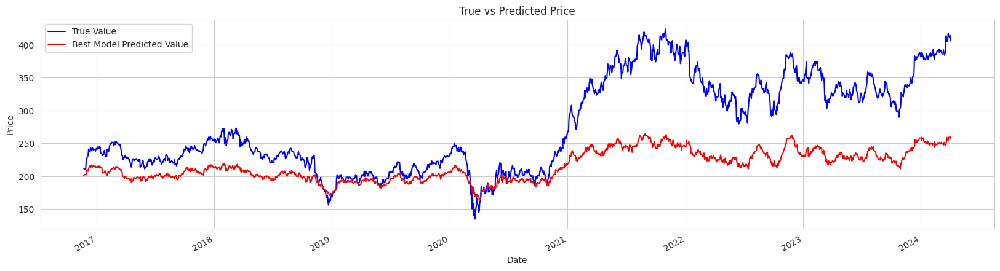

In [ ]:
plt.figure(figsize = (20,5))
plt.plot(test_dates, y_test, label='True Value', color='blue')
plt.plot(test_dates, predictions, label='Best Model Predicted Value', color='red')

plt.legend()
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('True vs Predicted Price')

plt.gcf().autofmt_xdate()


plt.show()

# Transfer Learning

## Data Load

In [ ]:
stock_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6272 entries, 1999-05-04 to 2024-04-05
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Open         6272 non-null   float64
 1   High         6272 non-null   float64
 2   Low          6272 non-null   float64
 3   Close        6272 non-null   float64
 4   Adj Close    6272 non-null   float64
 5   Volume       6272 non-null   int64  
 6   RSI          6272 non-null   float64
 7   SMA          6272 non-null   float64
 8   OBV          6272 non-null   int64  
 9   MACD         6272 non-null   float64
 10  MACD_signal  6272 non-null   float64
 11  MACD_diff    6272 non-null   float64
dtypes: float64(10), int64(2)
memory usage: 637.0 KB


In [ ]:
stock_data.describe()

,Open,High,Low,Close,Adj Close,Volume,RSI,SMA,OBV,MACD,MACD_signal,MACD_diff
count,6272.000000,6272.000000,6272.000000,6272.000000,6272.000000,6.272000e+03,6272.000000,6272.000000,6.272000e+03,6272.000000,6272.000000,6272.000000
mean,175.278475,177.359825,173.206678,175.311492,148.724170,5.027511e+06,51.985048,175.013018,-1.347620e+08,0.363471,0.359687,0.003784
std,84.407569,85.100612,83.714535,84.413664,85.821353,5.888386e+06,12.052375,84.035052,1.816509e+08,3.955250,3.722758,1.188391
min,54.000000,54.540001,47.410000,52.000000,40.078686,1.076000e+05,0.000000,60.218750,-5.165184e+08,-22.627686,-19.587493,-5.808592
25%,104.107500,105.407503,102.855627,104.250000,78.610992,2.361100e+06,43.305295,104.223958,-2.594389e+08,-1.712327,-1.577552,-0.572975
50%,162.949997,164.664993,161.205002,162.970001,131.895195,3.361550e+06,51.835741,163.066666,-2.085514e+08,0.584623,0.534042,0.008543
75%,214.724998,217.149998,212.482498,214.347504,183.683598,5.287125e+06,60.800712,213.871251,1.459608e+07,2.332157,2.217151,0.573885
max,423.119995,426.160004,414.980011,423.850006,417.690002,1.145907e+08,100.000000,414.327502,2.836555e+08,17.460347,15.233747,6.075226


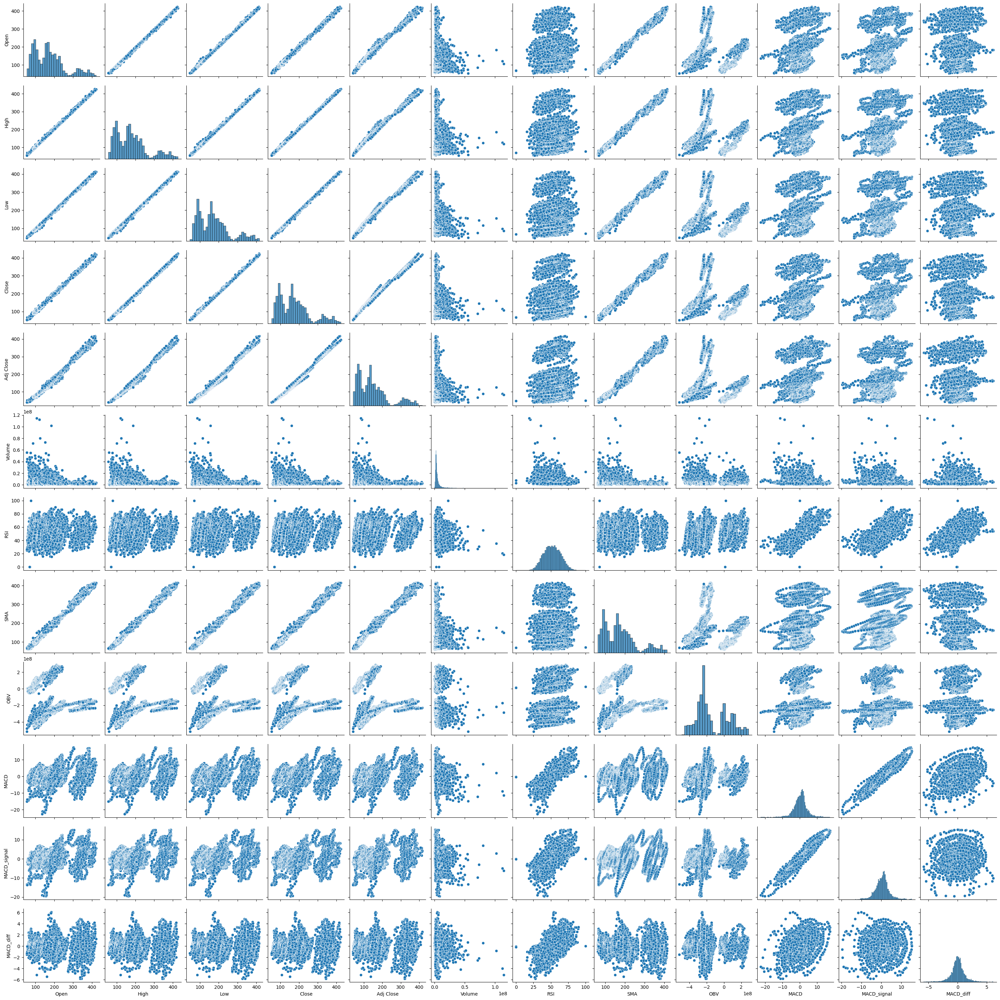

In [ ]:
sns.pairplot(stock_data)

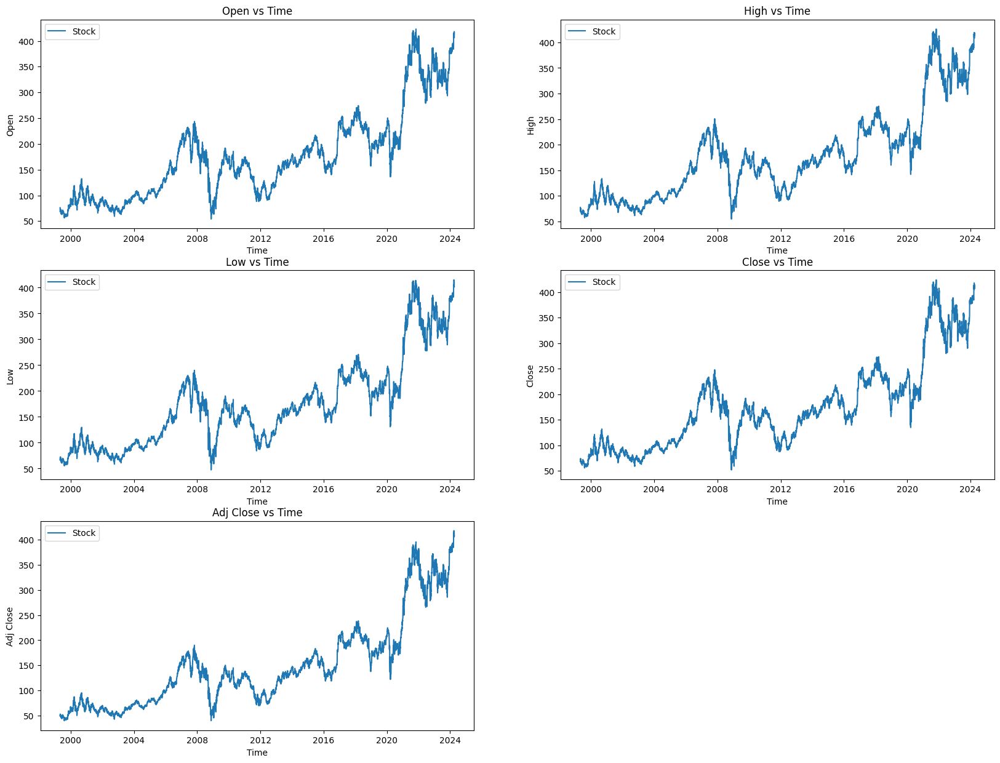

In [ ]:
info = ['Open', 'High', 'Low', 'Close','Adj Close', 'Volume']

plt.figure(figsize=(20, 15))

for i in range(5):
    plt.subplot(3, 2, i + 1)
    plt.plot(stock_data.index, stock_data[info[i]].values)
    plt.xlabel('Time')
    plt.ylabel(info[i])
    plt.legend(['Stock'])
    plt.title(info[i] + ' vs Time')

plt.show()

It has already been observed that features open, close, low and high are highly correlated, so we must drop two of them (low and high). The other feature will be volume traded.



### Scaling the data

In [ ]:
Xtrans = stock_data.drop(['Close', 'Low', 'High', 'Adj Close', 'RSI', 'SMA', 'OBV', 'MACD', 'MACD_signal', 'MACD_diff'], axis=1)
ytrans = stock_data['Close']

scaler_x = MinMaxScaler()
Xtrans = scaler_x.fit_transform(Xtrans)

scaler_y = MinMaxScaler()
ytrans = scaler_y.fit_transform(ytrans.values.reshape(-1, 1)).flatten()

# window length
length = 300
Xtrans_res = []
ytrans_res = []
dates_res = []

for i in range(length, len(Xtrans)):
    Xtrans_res.append(Xtrans[i-length:i])
    ytrans_res.append(ytrans[i])
    dates_res.append(stock_data.index[i])

Xtrans_res = np.array(Xtrans_res)
ytrans_res = np.array(ytrans_res)
dates_res = np.array(dates_res)

### Train Test Validation Split

In [ ]:
Xtrans_train_val, Xtrans_test, ytrans_train_val, ytrans_test, dates_train_val, dates_test = train_test_split(
    Xtrans_res, ytrans_res, dates_res, test_size=0.2, random_state=42, shuffle=False)

Xtrans_train, Xtrans_val, ytrans_train, ytrans_val, dates_train, dates_val = train_test_split(
    Xtrans_train_val, ytrans_train_val, dates_train_val, test_size=0.2, random_state=42, shuffle=False)

# Ensure time continuity of training set, verification set and test set to avoid time crossing
print("Training set date range:", dates_train[0], "to", dates_train[-1])
print("Validation set date range:", dates_val[0], "to", dates_val[-1])
print("Test set date range:", dates_test[0], "to", dates_test[-1])

Training set date range: 2000-07-11 00:00:00 to 2015-09-17 00:00:00
Validation set date range: 2015-09-18 00:00:00 to 2019-07-08 00:00:00
Test set date range: 2019-07-09 00:00:00 to 2024-04-05 00:00:00


## Model load

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving transfer_model.h5 to transfer_model.h5


In [ ]:
def reload_model():
    model = load_model('./transfer_model.h5')

    for i, layer in enumerate(model.layers):
        if i < 2:
            layer.trainable = False
        else:
            layer.trainable = True  # freeze the top2 layers
    return model

model = reload_model()
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_4 (Sequential)   (None, 300, 256)          135168    
                                                                 
 sequential_5 (Sequential)   (None, 300, 128)          164864    
                                                                 
 bidirectional_5 (Bidirecti  (None, 128)               98816     
 onal)                                                           
                                                                 
 batch_normalization_5 (Bat  (None, 128)               512       
 chNormalization)                                                
                                                                 
 dropout_5 (Dropout)         (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                

## Fine-tune and train the model

In [ ]:
model.compile(optimizer='adam', loss='mse')

checkp = ModelCheckpoint('./best_gs_model.h5', save_best_only=True, monitor='val_loss', verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)

# train model
history = model.fit(Xtrans_train, ytrans_train, epochs=100, batch_size=32,
                    validation_data=(Xtrans_val, ytrans_val),
                    callbacks=[checkp, early_stop])

# Load the best model to ensure the best performing version is used
model = load_model('./best_gs_model.h5')

ytrans_pred = model.predict(Xtrans_test)

Epoch 1/100
119/120 [============================>.] - ETA: 0s - loss: 0.0029
Epoch 1: val_loss improved from inf to 0.00656, saving model to ./best_gs_model.h5
120/120 [==============================] - 16s 66ms/step - loss: 0.0029 - val_loss: 0.0066
Epoch 2/100
120/120 [==============================] - ETA: 0s - loss: 0.0014
Epoch 2: val_loss improved from 0.00656 to 0.00608, saving model to ./best_gs_model.h5
120/120 [==============================] - 5s 39ms/step - loss: 0.0014 - val_loss: 0.0061
Epoch 3/100
120/120 [==============================] - ETA: 0s - loss: 0.0011
Epoch 3: val_loss improved from 0.00608 to 0.00110, saving model to ./best_gs_model.h5
120/120 [==============================] - 6s 46ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 4/100
119/120 [============================>.] - ETA: 0s - loss: 9.8039e-04
Epoch 4: val_loss did not improve from 0.00110
120/120 [==============================] - 5s 40ms/step - loss: 9.8159e-04 - val_loss: 0.0028
Epoch 5/100
119

Text(0.5, 1.0, 'Losses vs Epochs')

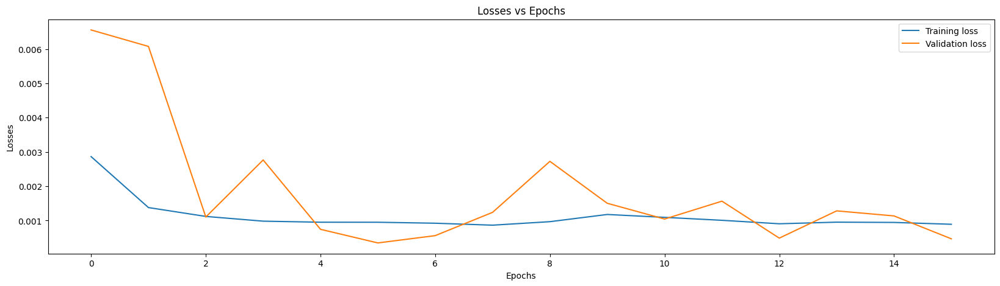

In [ ]:
# Check overfitting and underfitting
plt.figure(figsize = (20,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Training loss', 'Validation loss'])
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.title('Losses vs Epochs')

Despite the fluctuations, the two lines are not significantly separated and validation losses are not consistently rising, so overfitting may not be a major problem.

In [ ]:
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error
ytrans_pred = ytrans_pred.reshape(-1)
print('Goldman Sachs Group Inc.')
print('MSE : ' + str(mean_squared_error(ytrans_test, ytrans_pred)))
print('MAE : ' + str(mean_absolute_error(ytrans_test, ytrans_pred)))
print('r2  : ' + str(r2_score(ytrans_test, ytrans_pred)))

Goldman Sachs Group Inc.
MSE : 0.0282344621648995
MAE : 0.11275147394260318
r2  : 0.24263854706809662


The MSE value is 0.0282, which means that the prediction error of the model is relatively small.

The MAE has a value of 0.1128, which indicates that, on average, the difference between the model's predicted value and the actual value is about 0.113. This error is acceptable.

The R² is 0.2426, which indicates that only about 24.26% of the stock price movement is explained by the model. This means that nearly 75% of the change is not captured by the model.

## Visualization

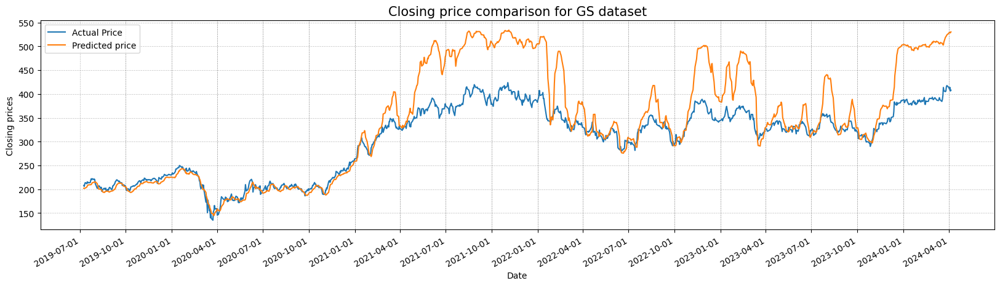

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.dates as mdates
# reshape to 2 dimension
ytrans_test_original = scaler_y.inverse_transform(ytrans_test.reshape(-1, 1))
ytrans_pred_original = scaler_y.inverse_transform(ytrans_pred.reshape(-1, 1))

plt.figure(figsize=(20, 5))
plt.plot(dates_test, ytrans_test_original, label='Actual Price')
plt.plot(dates_test, ytrans_pred_original, label='Predicted price')
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
quarters = pd.date_range(start=dates_test.min(), end=dates_test.max(), freq='QS')

for date in quarters:
    plt.axvline(x=date, color='grey', linestyle='--', alpha=0.5,linewidth=0.5)

plt.gcf().autofmt_xdate()
plt.xlabel('Date')
plt.ylabel('Closing prices')
plt.legend()
plt.title('Closing price comparison for GS dataset', fontsize=15)
plt.show()

Although models can predict stock prices to some extent, their predictive power is limited. Models capture only a small fraction of the changes, leaving a large number of fluctuations unexplained. This may be because stock market prices are affected by a variety of factors, including market sentiment, economic indicators, political events, etc., which may not be adequately accounted for in current models.

 Where actual prices have fluctuated wildly, the model's predictions are less accurate, which may be the main reason for the low R² value. Models need to be improved to better predict these fluctuations, especially when trying to capture the possible nonlinear behavior of the stock market.

# Deep Reinforcement Leaning

In [ ]:
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(stock_data, test_size=0.3, shuffle=False)

import pandas as pd

df_train_scaled = pd.DataFrame(df_train_scaled, columns=features_to_scale, index=df_train.index)
df_test_scaled = pd.DataFrame(df_test_scaled, columns=features_to_scale, index=df_test.index)

df_train_scaled['Close'] = df_train['Close']
df_test_scaled['Close'] = df_test['Close']

df_train_scaled.head()

## DQN (Deep Q Learning)

In [ ]:
import gym
from gym import spaces
import numpy as np
import pandas as pd

class StockTradingEnv(gym.Env):
    metadata = {'render.modes': ['human']}

    def __init__(self, df, model, initial_balance=50000, loss_limit=-4000, window=70):
        super().__init__()
        self.df = df
        self.initial_balance = initial_balance
        self.loss_limit = loss_limit
        self.window = window  # historical price window
        self.action_space = spaces.Discrete(3)  # 0: Hold, 1: Buy 1 stock, 2: Sell all
        self.model = model

    # Reset the environment to the initial state
    def reset(self):
        self.current_step = self.window
        self.done = False
        self.total_profit = 0
        self.balance = self.initial_balance # available balance
        self.positions = []  # store positions
        self.history = self.df.iloc[self.current_step-self.window:self.current_step].values # initial history
        return self.get_observation()  # get_observation for the initial state

    def get_observation(self):
      if self.model == 'lstm':
        stock_info = self.df.iloc[self.current_step-self.window:self.current_step].values
        extra_info = np.repeat([[self.total_profit, self.balance, sum(self.positions)]], self.window, axis=0)
        return np.concatenate([stock_info, extra_info], axis=1) # Concatenate along the features axis
      if self.model == 'mlp':
        stock_info = self.history.flatten()
        extra_info = np.array([self.total_profit, self.balance, sum(self.positions)])
        return np.concatenate([stock_info, extra_info], axis=0)

    # Get quintuple components
    def step(self, action):

        self.current_price = self.df.iloc[self.current_step-1]['Close']
        reward = 0  # Initialize reward

        if action == 1:  # buy
            self.balance -= self.current_price # adjust balance
            self.positions.append(self.current_price) # buy one stock at current price

        elif action == 2:  # sell
            if self.positions:
                sold_amount = sum(self.positions)
                gains = self.current_price*len(self.positions) - sold_amount
                self.balance += self.current_price*len(self.positions) # adjust balance
                self.total_profit += gains
                reward = gains
                self.positions = [] # clear positions
            else:
                reward = -10  # negative reward for invalid sell with no stocks

        self.current_step += 1
        # Check if the episode is done
        if self.total_profit <= self.loss_limit or self.current_step >= self.df.shape[0]:
            self.done = True

        self.history = np.array(self.df.iloc[self.current_step-self.window:self.current_step]) # update history
        next_state = self.get_observation() # Get observation of the next step

        return next_state, reward, self.done, {'Trade price': self.current_price , 'Total profit': self.total_profit, 'Available balance': self.balance, 'Position value': sum(self.positions)}

    # Render the environment
    def render(self, mode='human', close=False):
        action = self.action_space.sample() # choose a random action
        next_state, reward, done, info = self.step(action)
        print(f'Step:{self.current_step}')
        print(f'Next State: {next_state}')
        print(f"Action:{action}, Reward:{reward}, Done:{done}, Info:{info}")

In [ ]:
# keep only first 5 rows of df_train
data = df_train_scaled.iloc[:15][['Close', 'RSI', 'SMA', 'MACD']]
data

,Close,RSI,SMA,MACD
Date,,,,
1999-05-04,70.3750,4.079308,-1.416558,-0.049732
1999-05-05,69.1250,-4.381850,-1.430845,-0.082475
1999-05-06,67.9375,-4.381850,-1.444655,-0.138861
1999-05-07,74.1250,1.874544,-1.416201,-0.019945
1999-05-10,70.6875,-0.044335,-1.414844,-0.017160
1999-05-11,70.6250,-0.070228,-1.414177,-0.016986
1999-05-12,73.5000,0.876825,-1.404312,0.058086
1999-05-13,73.1875,0.739990,-1.397807,0.107489
1999-05-14,70.1875,-0.345776,-1.400367,0.065820


## Test the LSTM environment

In [ ]:
# Create the environment
env = StockTradingEnv(data, model='lstm', window=3)

# Check initial state
initial_state = env.reset()
initial_state

array([[ 7.03750000e+01,  4.07930768e+00, -1.41655812e+00,
        -4.97324031e-02,  0.00000000e+00,  5.00000000e+04,
         0.00000000e+00],
       [ 6.91250000e+01, -4.38185033e+00, -1.43084471e+00,
        -8.24753696e-02,  0.00000000e+00,  5.00000000e+04,
         0.00000000e+00],
       [ 6.79375000e+01, -4.38185033e+00, -1.44465508e+00,
        -1.38861370e-01,  0.00000000e+00,  5.00000000e+04,
         0.00000000e+00]])

In [ ]:
# Test the environment
observation = env.reset()
for i in range(12):
    env.render()
    print()

# Close the environment
env.close()

Step:4
Next State: [[ 6.91250000e+01 -4.38185033e+00 -1.43084471e+00 -8.24753696e-02
   0.00000000e+00  5.00000000e+04  0.00000000e+00]
 [ 6.79375000e+01 -4.38185033e+00 -1.44465508e+00 -1.38861370e-01
   0.00000000e+00  5.00000000e+04  0.00000000e+00]
 [ 7.41250000e+01  1.87454438e+00 -1.41620096e+00 -1.99450368e-02
   0.00000000e+00  5.00000000e+04  0.00000000e+00]]
Action:0, Reward:0, Done:False, Info:{'Trade price': 67.9375, 'Total profit': 0, 'Available balance': 50000, 'Position value': 0}

Step:5
Next State: [[ 6.79375000e+01 -4.38185033e+00 -1.44465508e+00 -1.38861370e-01
   0.00000000e+00  5.00000000e+04  0.00000000e+00]
 [ 7.41250000e+01  1.87454438e+00 -1.41620096e+00 -1.99450368e-02
   0.00000000e+00  5.00000000e+04  0.00000000e+00]
 [ 7.06875000e+01 -4.43345673e-02 -1.41484373e+00 -1.71595845e-02
   0.00000000e+00  5.00000000e+04  0.00000000e+00]]
Action:0, Reward:0, Done:False, Info:{'Trade price': 74.125, 'Total profit': 0, 'Available balance': 50000, 'Position value': 0

## Test the MLP environment

In [ ]:
# Create the environment
env = StockTradingEnv(data, model='mlp', window=3)

# Check initial state
initial_state = env.reset()
initial_state

array([ 7.03750000e+01,  4.07930768e+00, -1.41655812e+00, -4.97324031e-02,
        6.91250000e+01, -4.38185033e+00, -1.43084471e+00, -8.24753696e-02,
        6.79375000e+01, -4.38185033e+00, -1.44465508e+00, -1.38861370e-01,
        0.00000000e+00,  5.00000000e+04,  0.00000000e+00])

In [ ]:
# Test the environment
observation = env.reset()
for i in range(12):
    env.render()
    print()

# Close the environment
env.close()

Step:4
Next State: [ 6.91250000e+01 -4.38185033e+00 -1.43084471e+00 -8.24753696e-02
  6.79375000e+01 -4.38185033e+00 -1.44465508e+00 -1.38861370e-01
  7.41250000e+01  1.87454438e+00 -1.41620096e+00 -1.99450368e-02
  0.00000000e+00  5.00000000e+04  0.00000000e+00]
Action:2, Reward:-10, Done:False, Info:{'Trade price': 67.9375, 'Total profit': 0, 'Available balance': 50000, 'Position value': 0}

Step:5
Next State: [ 6.79375000e+01 -4.38185033e+00 -1.44465508e+00 -1.38861370e-01
  7.41250000e+01  1.87454438e+00 -1.41620096e+00 -1.99450368e-02
  7.06875000e+01 -4.43345673e-02 -1.41484373e+00 -1.71595845e-02
  0.00000000e+00  4.99258750e+04  7.41250000e+01]
Action:1, Reward:0, Done:False, Info:{'Trade price': 74.125, 'Total profit': 0, 'Available balance': 49925.875, 'Position value': 74.125}

Step:6
Next State: [ 7.41250000e+01  1.87454438e+00 -1.41620096e+00 -1.99450368e-02
  7.06875000e+01 -4.43345673e-02 -1.41484373e+00 -1.71595845e-02
  7.06250000e+01 -7.02277936e-02 -1.41417702e+00 -1

## Model

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import random
from collections import deque

# Define the DQN model with LSTM
class DQN_lstm(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers=1):
        super(DQN_lstm, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)  # Final fully connected layer

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(device)  # Initial hidden state
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(device)  # Initial cell state
        out, _ = self.lstm(x, (h0, c0))  # out: tensor of shape (batch_size, seq_length, hidden_dim)
        out = out[:, -1, :]  # Get outputs for the last time step
        return self.fc(out)

# Define the DQN model with mlp
class DQN_mlp(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(DQN_mlp, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Linear(32, output_dim)
        )

    def forward(self, x):
        return self.net(x)

## ReplayMemory

In [ ]:
# Define the Replay Memory
class ReplayMemory:
    def __init__(self, capacity):
        self.capacity = capacity # maximum
        self.memory = deque(maxlen=capacity) # replace the oldest transition, represented in the form of quintuple, with the latest transit when exceeds the maximum capacity

    def push(self, quintuple): # push a new transition to the memory
        self.memory.append(quintuple)

    def sample(self, batch_size): # random sample transitions of batch_size from the memory and use for training
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory) # return the current number of transitions in the memory

## Agent

In [ ]:
# Define the Agent
class Agent:
    def __init__(self, state_size, action_size, dqn_model, epsilon_start=1.0, epsilon_end=0.01, epsilon_decay=200):
        self.state_size = state_size
        self.action_size = action_size
        self.epsilon = epsilon_start # epsilon greedy policy to ensure exploration other than only choosing the action that gives the highest Q value
        self.epsilon_min = epsilon_end # ensure explorations closing to the end of the training cycle
        self.epsilon_decay = epsilon_decay # control how fast epsilon decays to it minimum
        self.model = dqn_model

    def act(self, state, test=False):
        if not test and random.random() <= self.epsilon: # if the randomly generated number is smaller than epsilon
            return random.randrange(self.action_size) # choose a random action
        else:
            state = torch.FloatTensor(state).unsqueeze(0).to(device)
            with torch.no_grad():
                action_values = self.model(state) # calculate the action values at the current state
            return np.argmax(action_values.cpu().detach().numpy()) # return the action with the highest state value

    def update_epsilon(self):
        self.epsilon = max(self.epsilon_min, self.epsilon * (1 - 1/self.epsilon_decay))

## Trainer

In [ ]:
class Trainer:
    def __init__(self, agent, memory, dqn_model, batch_size=128, gamma=0.99, lr=1e-3):
        self.agent = agent
        self.memory = memory
        self.batch_size = batch_size
        self.gamma = gamma # the discount factor
        self.optimizer = optim.Adam(agent.model.parameters(), lr=lr)
        self.dqn_model = dqn_model

    def train_step(self):
        if self.dqn_model == 'mlp':

            minibatch = self.memory.sample(self.batch_size) # sample transitions from the memory
            states, actions, rewards, next_states, dones = zip(*minibatch) # combining the current state

            states = torch.FloatTensor(np.array(states)).to(device)
            actions = torch.LongTensor(np.array(actions)).to(device)
            rewards = torch.FloatTensor(np.array(rewards)).to(device)
            next_states = torch.FloatTensor(np.array(next_states)).to(device)
            dones = torch.FloatTensor(np.array(dones)).to(device)

            # estimate the Q function and target using DQN
            Q_expected = self.agent.model(states).gather(1, actions.unsqueeze(1)).squeeze()
            Q_next = self.agent.model(next_states).detach().max(1)[0]
            Q_target = rewards + (self.gamma * Q_next * (1 - dones))

            loss = nn.MSELoss()(Q_expected, Q_target)

            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()

            return loss.item()

        if self.dqn_model == 'lstm':

            minibatch = self.memory.sample(self.batch_size)
            states, actions, rewards, next_states, dones = zip(*minibatch)

            states = torch.stack([torch.FloatTensor(s) for s in states]).to(device)
            next_states = torch.stack([torch.FloatTensor(s) for s in next_states]).to(device)
            actions = torch.LongTensor(np.array(actions)).view(-1, 1).to(device)
            rewards = torch.FloatTensor(np.array(rewards)).to(device)
            dones = torch.FloatTensor(np.array(dones)).to(device)

            Q_expected = self.agent.model(states).gather(1, actions).squeeze()
            Q_next = self.agent.model(next_states).detach().max(1)[0]
            Q_target = rewards + (self.gamma * Q_next * (1 - dones))

            loss = nn.MSELoss()(Q_expected, Q_target)
            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()

            return loss.item()

## LSTM

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
window_size = 100
state_size = df_train_scaled.shape[1]+3
action_size = env.action_space.n

# initialize environment
env = StockTradingEnv(df_train_scaled, model='lstm', window=window_size)

# initialize the model
lstm = DQN_lstm(input_dim=state_size, hidden_dim=64, output_dim=action_size).to(device)

# initialize agent
agent = Agent(state_size=state_size, action_size=action_size, dqn_model=lstm)

# initialize replay memory
memory = ReplayMemory(capacity=10000)

# initialize trainer
trainer = Trainer(agent, memory, dqn_model='lstm')

episode_reward = []
episode_loss = []
num_episodes = 100
initial_memory = 7000

# fill up the memory
while len(memory) < initial_memory:
    state = env.reset()
    done = False

    while not done:
        action = agent.act(state)
        next_state, reward, done, _ = env.step(action)
        memory.push((state, action, reward, next_state, done))
        state = next_state

for episode in range(num_episodes):
    state = env.reset()
    total_reward = 0
    total_loss = []
    done =False

    while not done:
        action = agent.act(state)
        next_state, reward, done, info = env.step(action)
        memory.push((state, action, reward, next_state, done))
        loss = trainer.train_step()
        total_loss.append(loss)

        agent.update_epsilon()

        state = next_state
        total_reward += reward

    episode_reward.append(total_reward)
    episode_loss.append(np.mean(total_loss))
    print(f"Episode: {episode+1}, Memory: {len(memory)}, Train Loss: {np.mean(total_loss):.4f}, Train Reward: {total_reward:.4f},  Total Profit: {info['Total profit']}")

Episode: 1, Memory: 10000, Train Loss: 6010.5993, Train Reward: 1685.1500,  Total Profit: 1745.1500205993652
Episode: 2, Memory: 10000, Train Loss: 37059.4867, Train Reward: 8434.1427,  Total Profit: 13714.142677307129
Episode: 3, Memory: 10000, Train Loss: 69841.2738, Train Reward: 4564.3765,  Total Profit: 4694.376461029053
Episode: 4, Memory: 10000, Train Loss: 44403.3247, Train Reward: -4470.6654,  Total Profit: 1689.3346366882324
Episode: 5, Memory: 10000, Train Loss: 2091.7359, Train Reward: -4487.1501,  Total Profit: 172.8498878479004
Episode: 6, Memory: 10000, Train Loss: 8943.2306, Train Reward: 19706.8471,  Total Profit: 19916.84708404541
Episode: 7, Memory: 10000, Train Loss: 26238.8930, Train Reward: -18095.4712,  Total Profit: 7234.52876663208
Episode: 8, Memory: 10000, Train Loss: 27491.6278, Train Reward: -8060.6727,  Total Profit: -4160.672744750977
Episode: 9, Memory: 10000, Train Loss: 13703.0533, Train Reward: -8761.1908,  Total Profit: -8751.190803527832
Episode: 10

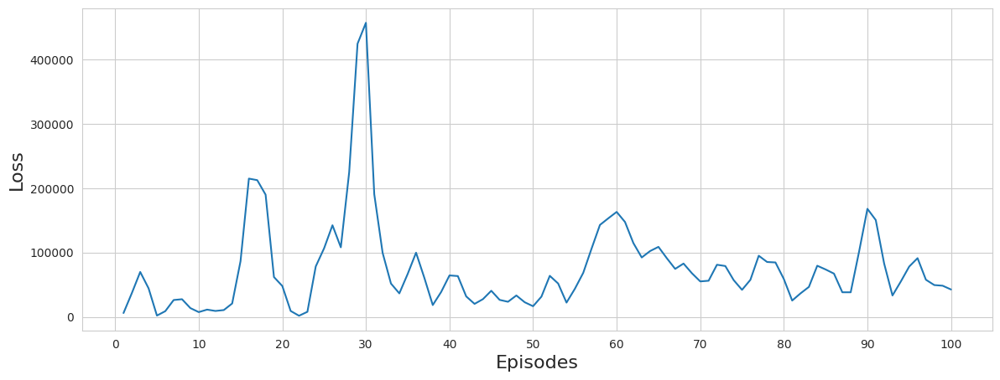

In [ ]:
episodes = list(range(1, num_episodes + 1))
plt.figure(figsize=(14, 5))
plt.plot(episodes, episode_loss, linestyle='-')
plt.xlabel('Episodes', size=16)
plt.ylabel('Loss', size = 16)
plt.grid(True)
plt.xticks(range(0, num_episodes + 1, 10))
plt.show()

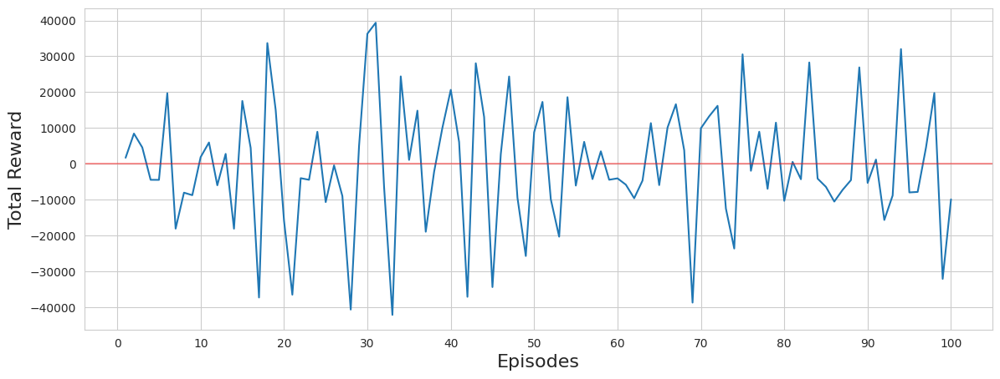

In [ ]:
episodes = list(range(1, num_episodes + 1))
plt.figure(figsize=(14, 5))
plt.plot(episodes, episode_reward, linestyle='-')
plt.xlabel('Episodes', size=16)
plt.ylabel('Total Reward', size = 16)
plt.grid(True)
plt.xticks(range(0, num_episodes + 1, 10))
plt.axhline(0, color='red', alpha=0.4)
plt.show()

In [ ]:
# test
env_test = StockTradingEnv(df_test_scaled, model='lstm', window=window_size)
state = env_test.reset()
total_reward = 0
done = False

while not done:
    action = agent.act(state, test=True)  # only take the optimal action for test
    next_state, reward, done, info = env_test.step(action)
    total_reward += reward
    state = next_state

print(f"Test reward: {total_reward:.4f}, Total profit: {info['Total profit']}")

Test reward: 19310.4821, Total profit: 19310.48210144043


## MLP

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
window_size = 100
state_size = window_size*df_train_scaled.shape[1]+3
action_size = env.action_space.n

# initialize environment
env = StockTradingEnv(df_train_scaled, model='mlp', window=window_size)

# initialize the model
mlp = DQN_mlp(state_size, action_size).to(device)

# initialize agent
agent = Agent(state_size=state_size, action_size=action_size, dqn_model=mlp)

# initialize replay memory
memory = ReplayMemory(capacity=10000)

# initialize trainer
trainer = Trainer(agent, memory, dqn_model='mlp')

episode_reward = []
episode_loss = []
num_episodes = 100
initial_memory = 7000

# fill up the memory
while len(memory) < initial_memory:
    state = env.reset()
    done = False

    while not done:
        action = agent.act(state)
        next_state, reward, done, _ = env.step(action)
        memory.push((state, action, reward, next_state, done))
        state = next_state

for episode in range(num_episodes):
    state = env.reset()
    total_reward = 0
    total_loss = []
    done =False

    while not done:
        action = agent.act(state)
        next_state, reward, done, info = env.step(action)
        memory.push((state, action, reward, next_state, done))
        loss = trainer.train_step()
        total_loss.append(loss)

        agent.update_epsilon()

        state = next_state
        total_reward += reward

    episode_reward.append(total_reward)
    episode_loss.append(np.mean(total_loss))
    print(f"Episode: {episode+1}, Memory: {len(memory)}, Train Loss: {np.mean(total_loss):.4f}, Train Reward: {total_reward:.4f},  Total Profit: {info['Total profit']}")

Episode: 1, Memory: 10000, Train Loss: 1009.2312, Train Reward: -6771.1089,  Total Profit: -6001.108924865723
Episode: 2, Memory: 10000, Train Loss: 10093.4337, Train Reward: 4117.8411,  Total Profit: 8757.841144561768
Episode: 3, Memory: 10000, Train Loss: 12306.9242, Train Reward: 2788.3373,  Total Profit: 9978.337257385254
Episode: 4, Memory: 10000, Train Loss: 7274.6725, Train Reward: -4199.8049,  Total Profit: -1149.8049278259277
Episode: 5, Memory: 10000, Train Loss: 10074.6727, Train Reward: 9156.0442,  Total Profit: 13896.044185638428
Episode: 6, Memory: 10000, Train Loss: 50849.1981, Train Reward: -3600.0764,  Total Profit: 7229.923633575439
Episode: 7, Memory: 10000, Train Loss: 10205.6602, Train Reward: -10403.5796,  Total Profit: -7863.579601287842
Episode: 8, Memory: 10000, Train Loss: 6794.9118, Train Reward: -3484.7148,  Total Profit: 2595.2851600646973
Episode: 9, Memory: 10000, Train Loss: 6375.0110, Train Reward: -3765.3765,  Total Profit: 7834.623455047607
Episode: 1

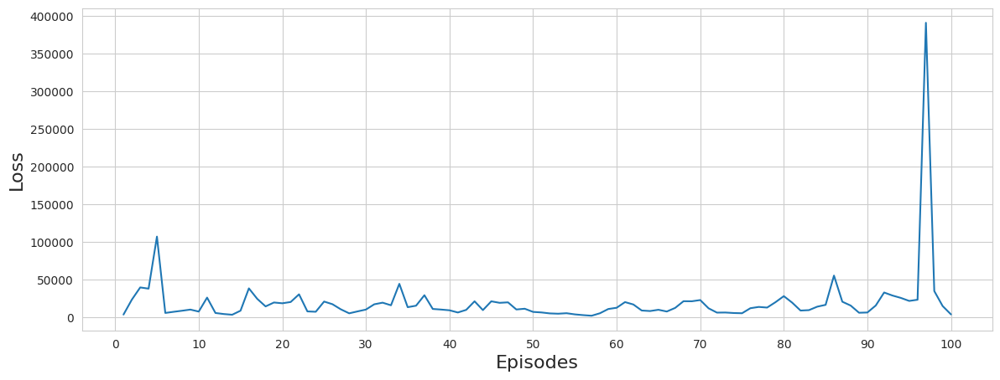

In [ ]:
episodes = list(range(1, num_episodes + 1))
plt.figure(figsize=(14, 5))
plt.plot(episodes, episode_loss, linestyle='-')
plt.xlabel('Episodes', size=16)
plt.ylabel('Loss', size = 16)
plt.grid(True)
plt.xticks(range(0, num_episodes + 1, 10))
plt.show()

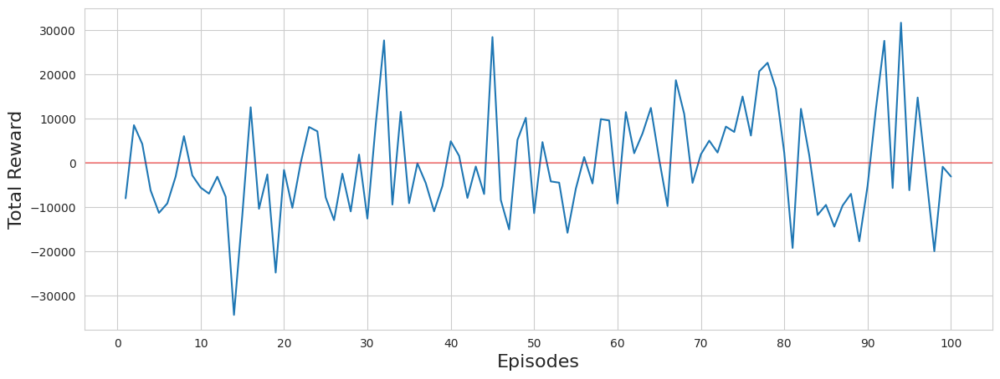

In [ ]:
episodes = list(range(1, num_episodes + 1))
plt.figure(figsize=(14, 5))
plt.plot(episodes, episode_reward, linestyle='-')
plt.xlabel('Episodes', size=16)
plt.ylabel('Total Reward', size = 16)
plt.grid(True)
plt.xticks(range(0, num_episodes + 1, 10))
plt.axhline(0, color='red', alpha=0.4)
plt.show()

In [ ]:
# test
env_test = StockTradingEnv(df_test_scaled, model='mlp', window=window_size)
state = env_test.reset()
total_reward = 0
done = False

while not done:
    action = agent.act(state, test=True)  # only take the optimal action for test
    next_state, reward, done, info = env_test.step(action)
    total_reward += reward
    state = next_state

print(f"Test reward: {total_reward:.4f}, Total profit: {info['Total profit']}")

Test reward: 0.0000, Total profit: 0


# Conclusion

The traditional model of polynomial regression can outperform other traditional models, indicating polynomial regression is complex enough to capture all the variations. The XGBoost would lead to overfitting. For LSTM, we can try more combinations of layers to capture enough variation in the future. The reinforcement learning, on the other hand, took into account complex trading logics and disordered the time information in the ReplayMemory, thereby offering more robust trading strategies. However, huge amounts of training episodes are required for convergence, and like traditional and deep learning methods, stock prices information and technical indices alone are not enough for capturing the complexity of the stock market.

The transfer learning application from Google's stock model to Goldman Sachs has shown a low prediction error with MSE at 0.0282 and an acceptable average error (MAE) of 0.1128, yet it explains only 24.26% of stock price movements (R²), indicating limited predictive power and substantial unexplained variability. Moreover, the model's limited capability in capturing stock price movements might be exacerbated by its failure to integrate diverse and unpredictable factors such as market sentiment, economic indicators, and political events, which are crucial for accurate stock price prediction.


# Challenge



**Factors Choices**
Stock prices are influenced by a multitude of factors, such as market sentiment, economic indicators, and political events.  These dynamics are complex and often interrelated, posing a challenge for predictive models which might not capture these nuances fully.  This necessitates careful consideration in model selection and ongoing adjustments to model parameters based on observed performance.

**Model Selection Criteria:**
Choosing the right model involves assessing its ability to generalize well beyond the training data, particularly given the volatile nature of financial markets.  The selected model should be robust against overfitting, with a proven capability to handle the intricate patterns seen in stock price fluctuations due to external factors.

**Designing the Environment and Reward Mechanism:**
For effective training of models using reinforcement learning, such as Deep Q-Networks (DQN), it is crucial to design an environment that accurately simulates the trading market.  The reward mechanism must align closely with realistic trading objectives, such as maximizing return on investment while minimizing risk, to guide the model towards profitable trading strategies.

**Theoretical Understanding of DQN and Finance:**
Deep Q-Networks (DQN) integrate deep learning with Q-learning, a form of reinforcement learning.  This combination is potent for navigating the sequential decision-making process in stock trading.  A deep theoretical understanding of how DQN works and its implications in financial contexts is essential for tuning the model to respond to market dynamics effectively.

**Running DQN Experiments:**
Executing DQN experiments is computationally intensive, requiring substantial computational resources.  These experiments often run for extended periods, necessitating robust hardware and efficient programming to manage the computational load.  The complexity increases with the need for real-time data processing and the application of advanced machine learning techniques to capture temporal dependencies and other relevant features in the data.

# Reference

1. https://www.kaggle.com/code/shiratorizawa/nyse-stock-price-prediction-and-transfer-learning

2. Raschka, S., & Mirjalili, V. (2019). Python Machine Learning: Machine Learning and Deep Learning with Python, Scikit-learn, and TensorFlow 2. Packt.

3. https://github.com/AminHP/gym-anytrading

4. We also use ai to debug and help us to find high level techique to solve problems.


